In [1]:
from keras.models import Sequential
from keras.layers import Dense
import tensorflow as tf
import keras
import numpy as np
import pandas as pd
import pyvista as pv
import tensorflow_addons as tfa
import matplotlib.pyplot as plt
from keras.utils import normalize
from sklearn.model_selection import KFold

from numpy import arange,absolute,mean,std
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import cross_validate
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_predict
from fast_ml.model_development import train_valid_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

In [2]:
#RawData = np.loadtxt('SeisData.dat', unpack = False)
Porosity = np.loadtxt('Porosity3.dat', unpack = True)
print(Porosity.shape)
Seismic = np.loadtxt('Seismic_data.dat', unpack = True)
print(Seismic.shape)

(78, 40401)
(78, 40401)


In [3]:
ReshapedDataSeis = Seismic.reshape((78,201,201))
mat_sliceSeis = ReshapedDataSeis[8:] # Simple indexing
TransposedDataSeis=mat_sliceSeis.T
FlippedDataSeis=np.flip(TransposedDataSeis)

print ('ReshapedData shape is:', mat_sliceSeis.shape)
print ('Transposed&FlippedData shape is:', FlippedDataSeis.shape)

VolumeSeis = pv.UniformGrid()
VolumeSeis.dimensions = FlippedDataSeis.shape

VolumeSeis.origin = (0 , 0 , 0)
VolumeSeis.spacing = (1, 1, 3)  # These are the cell sizes along each axis
VolumeSeis.point_data["Seismic (Amplitude)"] = FlippedDataSeis.flatten(order='F').T #'C', 'F', 'A', or 'K'

ReshapedData shape is: (70, 201, 201)
Transposed&FlippedData shape is: (201, 201, 70)


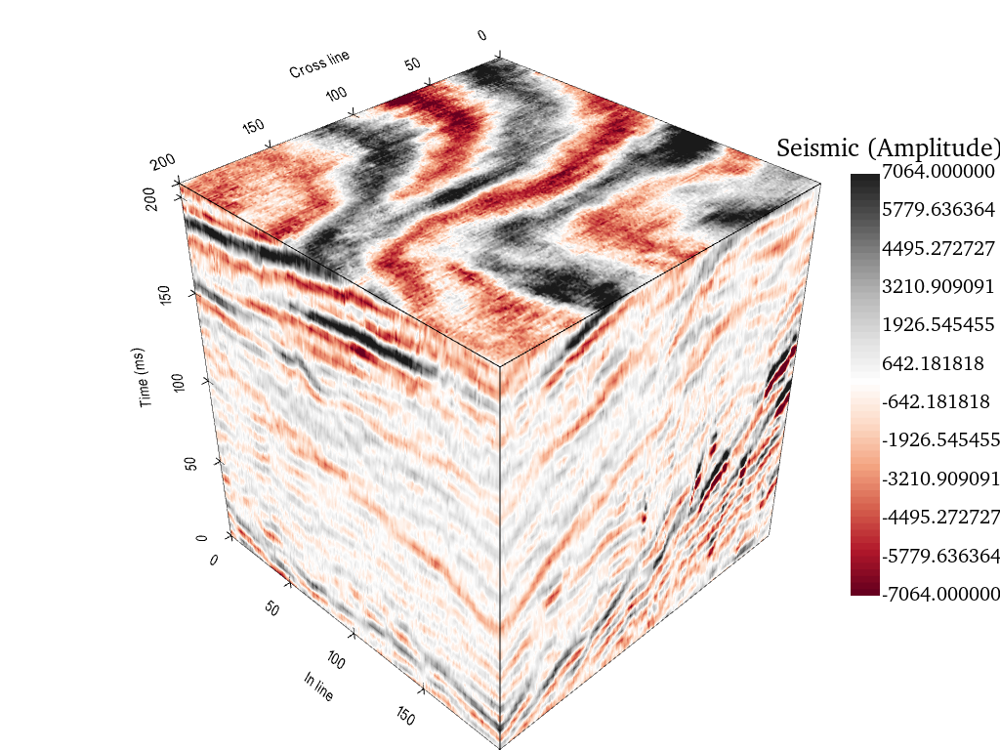

In [4]:
pv.set_jupyter_backend('static') 
pv.global_theme.background = 'white' 

ValuePor1 = dict(height=0.6, vertical=True  ,position_x=0.85, position_y=0.20 ,
             title_font_size=26, label_font_size=20 ,shadow=False ,n_labels=12 ,
             italic=False ,fmt="%.2f" ,font_family="times",color='k')


ValueSeis1 = dict(height=0.6, vertical=True  ,position_x=0.85, position_y=0.20 ,
             title_font_size=26, label_font_size=20 ,shadow=False ,n_labels=12 ,
             italic=False ,fmt="%.6f" ,font_family="times",color='k')

pSeis1 = pv.Plotter()
#cmap='RdGy' ,clim=[-7064,7064]

pSeis1.add_mesh(VolumeSeis ,clim=[-7064,7064] ,flip_scalars=False ,cmap='RdGy' ,lighting=False ,
               scalar_bar_args=ValueSeis1 ,render_points_as_spheres=False ,render_lines_as_tubes=True ,
               use_transparency=False ,smooth_shading=True ,annotations=False ,pbr=True ,roughness=0.5 ,
               edge_color=None ,point_size=50.0 ,line_width=500 ,preference='cells')


pSeis1.show_grid(xlabel="Cross line", ylabel="In line", zlabel="Time (ms)",
                location='outer',all_edges=True ,padding=0.0  ,color='k' ,use_2d=40 ,grid='outer')

pSeis1.show()

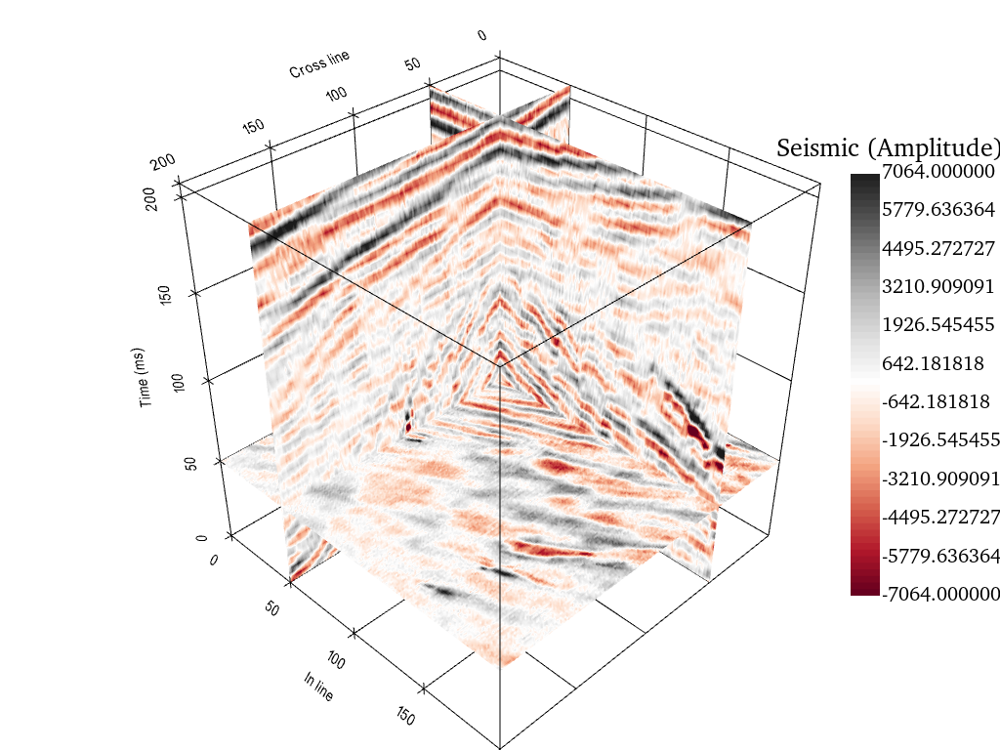

In [5]:
sliceIMGSeis = pv.Plotter()


sliceIMGSeis.add_mesh(VolumeSeis.slice_orthogonal(x=50, y=50 , z=50) ,clim=[-7064,7064] ,flip_scalars=False,
                      cmap='RdGy' ,lighting=False ,scalar_bar_args=ValueSeis1 ,render_points_as_spheres=False,
                      render_lines_as_tubes=True ,use_transparency=False ,smooth_shading=True ,annotations=False,
                      pbr=True ,roughness=0.5 ,edge_color=None ,point_size=50.0 ,line_width=500 ,preference='cells')


sliceIMGSeis.show_grid(xlabel="Cross line", ylabel="In line", zlabel="Time (ms)",
                location='outer',all_edges=True ,padding=0.0  ,color='k' ,use_2d=40 ,grid='outer')

sliceIMGSeis.show()

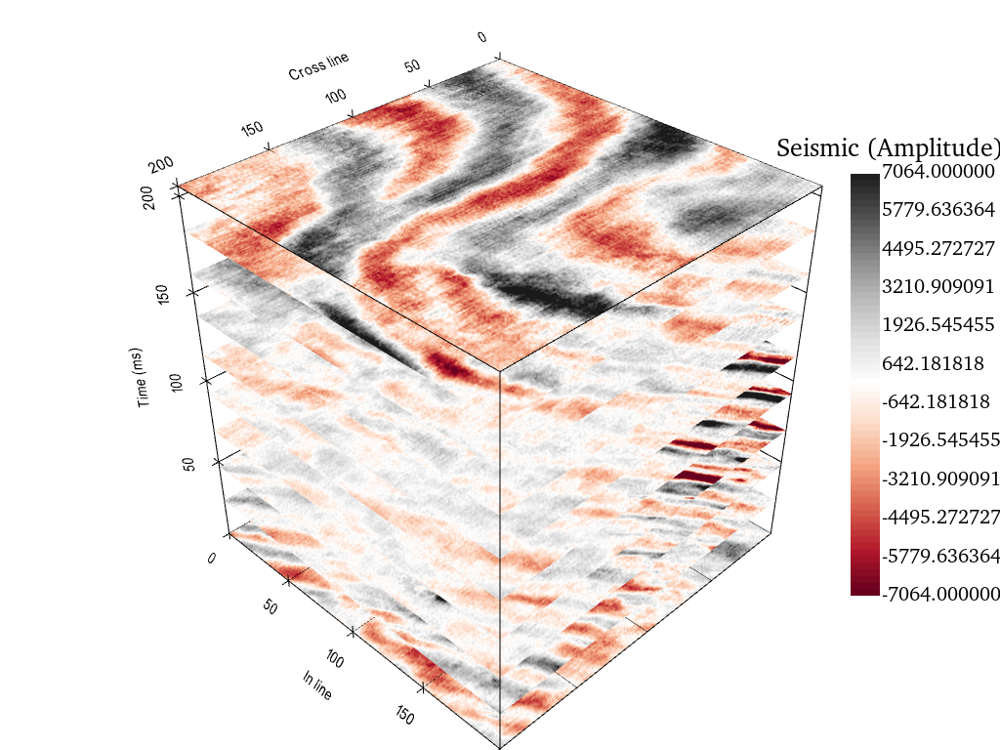

In [419]:
sliceZ= pv.Plotter()


sliceZ.add_mesh(VolumeSeis.slice_along_axis(n=10, axis="z") ,clim=[-7064,7064],flip_scalars=False ,cmap='RdGy' ,lighting=False ,
               scalar_bar_args=ValuePor1 ,render_points_as_spheres=False ,render_lines_as_tubes=True ,
               use_transparency=False ,smooth_shading=True ,annotations=False ,pbr=True ,roughness=0.5 ,
               edge_color=None ,point_size=50.0 ,line_width=500 ,preference='cells')


sliceZ.show_grid(xlabel="Cross line", ylabel="In line", zlabel="Time (ms)",
                location='outer',all_edges=True ,padding=0.0  ,color='k' ,use_2d=40 ,grid='outer')

sliceZ.show()

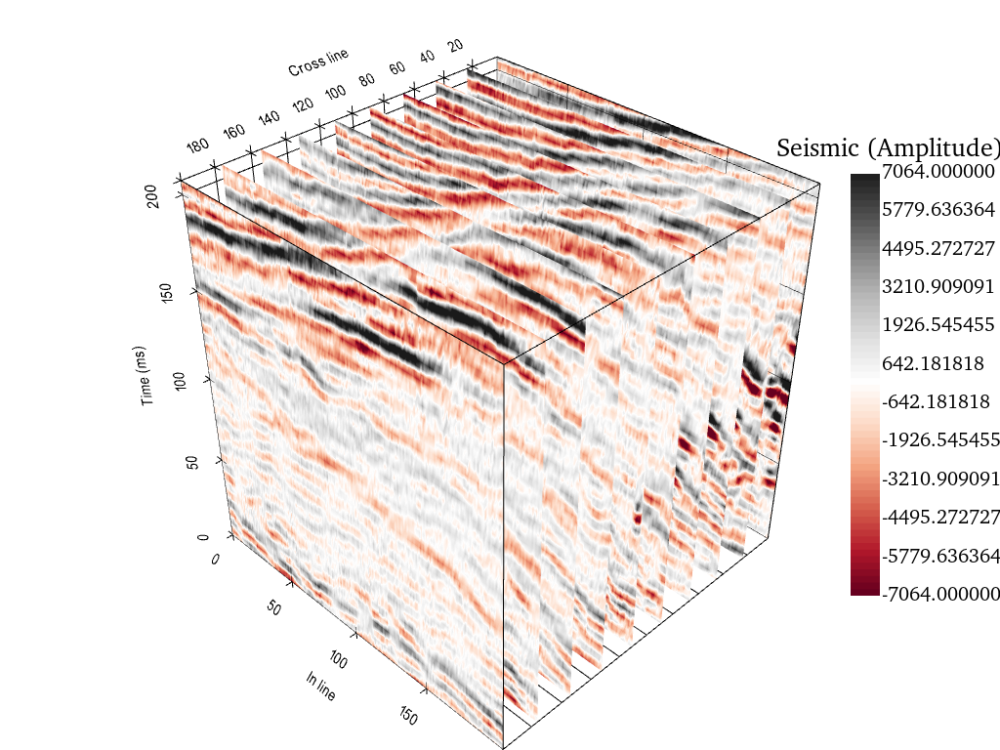

In [420]:
sliceZ= pv.Plotter()


sliceZ.add_mesh(VolumeSeis.slice_along_axis(n=10, axis="x") ,clim=[-7064,7064],flip_scalars=False ,cmap='RdGy' ,lighting=False ,
               scalar_bar_args=ValuePor1 ,render_points_as_spheres=False ,render_lines_as_tubes=True ,
               use_transparency=False ,smooth_shading=True ,annotations=False ,pbr=True ,roughness=0.5 ,
               edge_color=None ,point_size=50.0 ,line_width=500 ,preference='cells')


sliceZ.show_grid(xlabel="Cross line", ylabel="In line", zlabel="Time (ms)",
                location='outer',all_edges=True ,padding=0.0  ,color='k' ,use_2d=40 ,grid='outer')

sliceZ.show()

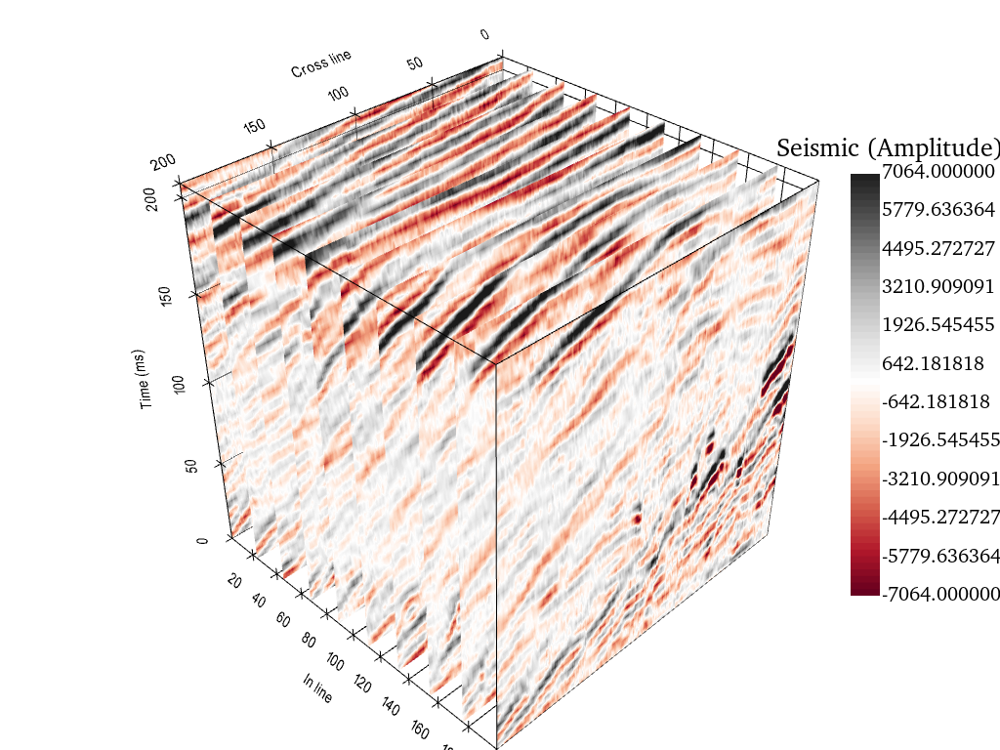

In [421]:
sliceZ= pv.Plotter()


sliceZ.add_mesh(VolumeSeis.slice_along_axis(n=10, axis="y") ,clim=[-7064,7064],flip_scalars=False ,cmap='RdGy' ,lighting=False ,
               scalar_bar_args=ValuePor1 ,render_points_as_spheres=False ,render_lines_as_tubes=True ,
               use_transparency=False ,smooth_shading=True ,annotations=False ,pbr=True ,roughness=0.5 ,
               edge_color=None ,point_size=50.0 ,line_width=500 ,preference='cells')


sliceZ.show_grid(xlabel="Cross line", ylabel="In line", zlabel="Time (ms)",
                location='outer',all_edges=True ,padding=0.0  ,color='k' ,use_2d=40 ,grid='outer')

sliceZ.show()

In [6]:
ReshapedDataPor = Porosity.reshape((78,201,201))
mat_slicePor = ReshapedDataPor[8:] # Simple indexing
TransposedDataPor=mat_slicePor.T
FlippedDataPor=np.flip(TransposedDataPor)

print ('ReshapedData shape is:', mat_slicePor.shape)
print ('Transposed&FlippedData shape is:', FlippedDataPor.shape)

VolumePor = pv.UniformGrid()
VolumePor.dimensions = FlippedDataPor.shape

VolumePor.origin = (0 , 0 , 0)
VolumePor.spacing = (1, 1, 3)  # These are the cell sizes along each axis
VolumePor.point_data["Porosity (Fraction)"] = FlippedDataPor.flatten(order='F').T #'C', 'F', 'A', or 'K'

ReshapedData shape is: (70, 201, 201)
Transposed&FlippedData shape is: (201, 201, 70)


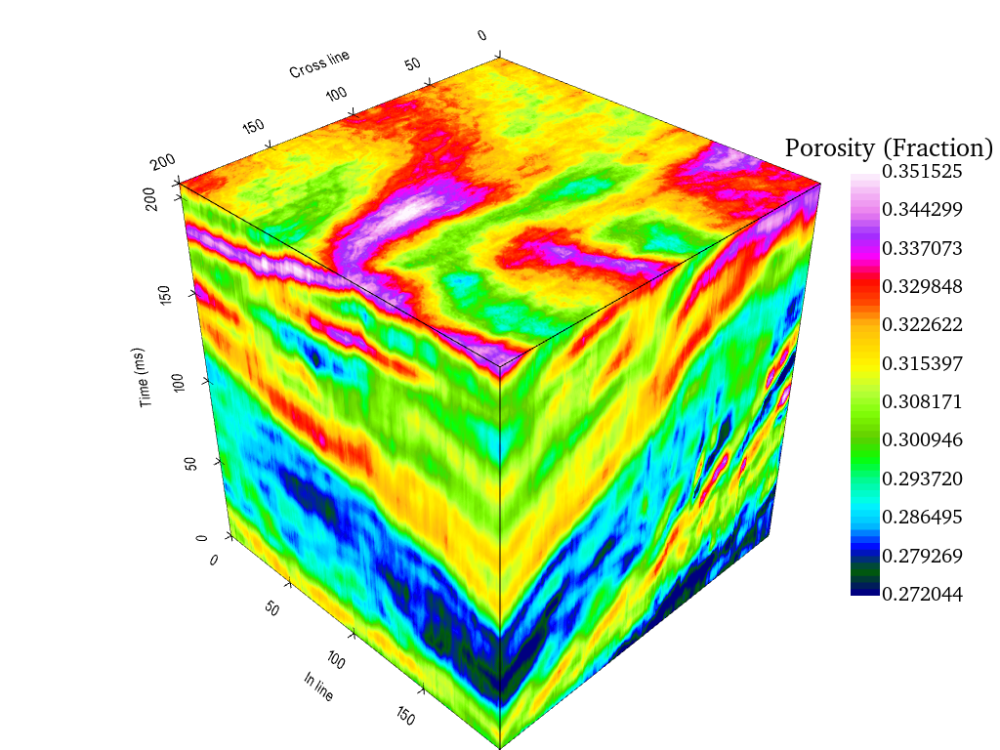

In [7]:
pv.set_jupyter_backend('static') 
pv.global_theme.background = 'white' 

ValuePor1 = dict(height=0.6, vertical=True  ,position_x=0.85, position_y=0.20 ,
             title_font_size=26, label_font_size=20 ,shadow=False ,n_labels=12 ,
             italic=False ,fmt="%.6f" ,font_family="times",color='k')

pPor1 = pv.Plotter()


pPor1.add_mesh(VolumePor ,clim=[0.2720436,0.3515245] ,flip_scalars=False ,cmap='gist_ncar' ,lighting=False ,
               scalar_bar_args=ValuePor1 ,render_points_as_spheres=False ,render_lines_as_tubes=True ,
               use_transparency=False ,smooth_shading=True ,annotations=False ,pbr=True ,roughness=0.5 ,
               edge_color=None ,point_size=50.0 ,line_width=500 ,preference='cells')


pPor1.show_grid(xlabel="Cross line", ylabel="In line", zlabel="Time (ms)",
                location='outer',all_edges=True ,padding=0.0  ,color='k' ,use_2d=40 ,grid='outer')

pPor1.show()

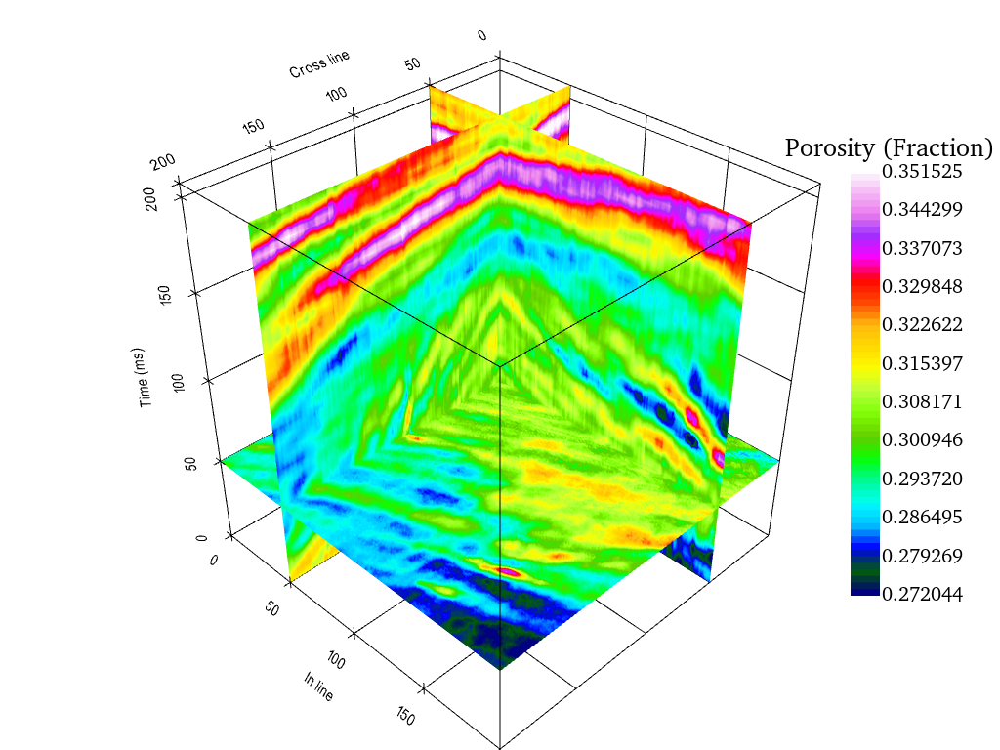

In [8]:
sliceIMG = pv.Plotter()


sliceIMG.add_mesh(VolumePor.slice_orthogonal(x=50, y=50 , z=50) ,clim=[0.2720436,0.3515245] ,flip_scalars=False ,cmap='gist_ncar' ,lighting=False ,
               scalar_bar_args=ValuePor1 ,render_points_as_spheres=False ,render_lines_as_tubes=True ,
               use_transparency=False ,smooth_shading=True ,annotations=False ,pbr=True ,roughness=0.5 ,
               edge_color=None ,point_size=50.0 ,line_width=500 ,preference='cells')


sliceIMG.show_grid(xlabel="Cross line", ylabel="In line", zlabel="Time (ms)",
                location='outer',all_edges=True ,padding=0.0  ,color='k' ,use_2d=40 ,grid='outer')

sliceIMG.show()

SeisData=Seismic.T
PorData=Porosity.T

XSamples=pd.DataFrame(SeisData)
print(XSamples.shape)
ySamples=pd.DataFrame(PorData)
print(ySamples.shape) 

In [9]:
PorData=Porosity.T
SeisData=Seismic.T

Seisdf=pd.DataFrame(SeisData)
#Seisdf
Pordf=pd.DataFrame(PorData)
#Pordf
SeiSamples = Seisdf.sample(frac=0.7005, random_state=50)
SPorSamples = Pordf.sample(frac=0.7005, random_state=50)

In [10]:
X_train=Seisdf.drop([0, 1], axis=1)
print(X_train.shape)
y_train=Pordf.drop([0, 1], axis=1)
print(y_train.shape)

(40401, 76)
(40401, 76)


In [311]:
Xtrain, Xval, ytrain, yval = train_test_split(X_train, y_train, test_size = 0.13, random_state = 0)

Xtrain = normalize(Xtrain, axis=1)
Xval = normalize(Xval, axis=1)

print("Train size is ", Xtrain.shape)
print("Test size is ", Xval.shape)

Train size is  (35148, 76)
Test size is  (5253, 76)


In [312]:
n_inputs, n_outputs = Xtrain.shape[1], Xval.shape[1]
n_inputs, n_outputs

(76, 76)

In [313]:
#X_TEST=Seisdf.drop([0, 1], axis=1)
#y_TEST=Pordf.drop([0, 1], axis=1)
#print(X_TEST.shape) ,print(y_TEST.shape)
#Xval = normalize(Xval, axis=1)

In [314]:
Adam = keras.optimizers.Adam(lr=0.001)
SGD = keras.optimizers.SGD(lr=0.001)
RMSProP = tf.keras.optimizers.RMSprop(learning_rate=0.001)
NaDam = tf.keras.optimizers.Nadam(learning_rate=0.001)
AdaDelta = tf.keras.optimizers.Adadelta(learning_rate=0.001)
AdaGrad = tf.keras.optimizers.Adagrad(learning_rate=0.001)
AdaMax = tf.keras.optimizers.Adamax(learning_rate=0.001)
FtrL = tf.keras.optimizers.Ftrl(learning_rate=0.001)

In [315]:
def Exp_1(n_inputs, n_outputs):
    model_ADAM = Sequential()
    model_ADAM.add(Dense(400, input_dim=n_inputs, activation='relu'))
    model_ADAM.add(Dense(400, activation='relu'))
    model_ADAM.add(Dense(400, activation='relu'))
    model_ADAM.add(Dense(400, activation='relu'))
    model_ADAM.add(Dense(n_outputs))
    model_ADAM.compile(loss='mean_squared_error', optimizer=Adam,
                       metrics=["mae",tf.keras.metrics.RootMeanSquaredError(),tfa.metrics.r_square.RSquare()])
    return model_ADAM

def Exp_2(n_inputs, n_outputs):
    model_SGD = Sequential()
    model_SGD.add(Dense(400, input_dim=n_inputs, activation='relu'))
    model_SGD.add(Dense(400, activation='relu'))
    model_SGD.add(Dense(400, activation='relu'))
    model_SGD.add(Dense(400, activation='relu'))
    model_SGD.add(Dense(n_outputs))
    model_SGD.compile(loss='mean_squared_error',optimizer=SGD,
                      metrics=["mae",tf.keras.metrics.RootMeanSquaredError(),tfa.metrics.r_square.RSquare()])
    return model_SGD

def Exp_3(n_inputs, n_outputs):
    model_RMS = Sequential()
    model_RMS.add(Dense(400, input_dim=n_inputs, activation='relu'))
    model_RMS.add(Dense(400, activation='relu'))
    model_RMS.add(Dense(400, activation='relu'))
    model_RMS.add(Dense(400, activation='relu'))
    model_RMS.add(Dense(n_outputs))
    model_RMS.compile(loss='mean_squared_error',optimizer=RMSProP,
                      metrics=["mae",tf.keras.metrics.RootMeanSquaredError(),tfa.metrics.r_square.RSquare()])
    return model_RMS

def Exp_4(n_inputs, n_outputs):
    model_Nadam = Sequential()
    model_Nadam.add(Dense(400, input_dim=n_inputs, activation='relu'))
    model_Nadam.add(Dense(400, activation='relu'))
    model_Nadam.add(Dense(400, activation='relu'))
    model_Nadam.add(Dense(400, activation='relu'))
    model_Nadam.add(Dense(n_outputs))
    model_Nadam.compile(loss='mean_squared_error', optimizer=NaDam,
                        metrics=["mae",tf.keras.metrics.RootMeanSquaredError(),tfa.metrics.r_square.RSquare()])
    return model_Nadam

def Exp_5(n_inputs, n_outputs):
    model_AdaDelta = Sequential()
    model_AdaDelta.add(Dense(400, input_dim=n_inputs, activation='relu'))
    model_AdaDelta.add(Dense(400, activation='relu'))
    model_AdaDelta.add(Dense(400, activation='relu'))
    model_AdaDelta.add(Dense(400, activation='relu'))
    model_AdaDelta.add(Dense(n_outputs))
    model_AdaDelta.compile(loss='mean_squared_error', optimizer=AdaDelta,
                  metrics=["mae",tf.keras.metrics.RootMeanSquaredError(),tfa.metrics.r_square.RSquare()])
    return model_AdaDelta

def Exp_6(n_inputs, n_outputs):
    model_AdaGrad = Sequential()
    model_AdaGrad.add(Dense(400, input_dim=n_inputs, activation='relu'))
    model_AdaGrad.add(Dense(400, activation='relu'))
    model_AdaGrad.add(Dense(400, activation='relu'))
    model_AdaGrad.add(Dense(400, activation='relu'))
    model_AdaGrad.add(Dense(n_outputs))
    model_AdaGrad.compile(loss='mean_squared_error',optimizer=AdaGrad,
                        metrics=["mae",tf.keras.metrics.RootMeanSquaredError(),tfa.metrics.r_square.RSquare()])
    return model_AdaGrad

def Exp_7(n_inputs, n_outputs):
    model_AdaMax = Sequential()
    model_AdaMax.add(Dense(400, input_dim=n_inputs, activation='relu'))
    model_AdaMax.add(Dense(400, activation='relu'))
    model_AdaMax.add(Dense(400, activation='relu'))
    model_AdaMax.add(Dense(400, activation='relu'))
    model_AdaMax.add(Dense(n_outputs))
    model_AdaMax.compile(loss='mean_squared_error',optimizer=AdaMax,
                         metrics=["mae",tf.keras.metrics.RootMeanSquaredError(),tfa.metrics.r_square.RSquare()])
    return model_AdaMax

def Exp_8(n_inputs, n_outputs):
    model_FtrL = Sequential()
    model_FtrL.add(Dense(400, input_dim=n_inputs, activation='relu'))
    model_FtrL.add(Dense(400, activation='relu'))
    model_FtrL.add(Dense(400, activation='relu'))
    model_FtrL.add(Dense(400, activation='relu'))
    model_FtrL.add(Dense(n_outputs))
    model_FtrL.compile(loss='mean_squared_error',optimizer=FtrL,
                  metrics=["mae",tf.keras.metrics.RootMeanSquaredError(),tfa.metrics.r_square.RSquare()])
    return model_FtrL

In [316]:
model1= Exp_1(n_inputs, n_outputs)
model1.summary()

model2= Exp_2(n_inputs, n_outputs)
model2.summary()

model3= Exp_3(n_inputs, n_outputs)
model3.summary()

model4= Exp_4(n_inputs, n_outputs)
model4.summary()

model5= Exp_5(n_inputs, n_outputs)
model5.summary()

model6= Exp_6(n_inputs, n_outputs)
model6.summary()

model7= Exp_7(n_inputs, n_outputs)
model7.summary()

model8= Exp_8(n_inputs, n_outputs)
model8.summary()

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_40 (Dense)            (None, 400)               30800     
                                                                 
 dense_41 (Dense)            (None, 400)               160400    
                                                                 
 dense_42 (Dense)            (None, 400)               160400    
                                                                 
 dense_43 (Dense)            (None, 400)               160400    
                                                                 
 dense_44 (Dense)            (None, 76)                30476     
                                                                 
Total params: 542,476
Trainable params: 542,476
Non-trainable params: 0
_________________________________________________________________
Model: "sequential_9"
__________________________

 dense_78 (Dense)            (None, 400)               160400    
                                                                 
 dense_79 (Dense)            (None, 76)                30476     
                                                                 
Total params: 542,476
Trainable params: 542,476
Non-trainable params: 0
_________________________________________________________________


In [317]:
Iteration =50 #
Experiment1 = model1.fit(Xtrain ,ytrain,batch_size=64,
                            validation_data=(Xval,yval),epochs = Iteration, verbose = 1)
#model1.save('d:/Grav_Mag/Results/Gravity/model/Gravity_AdamANN.h5')

Epoch 1/50
1099/1099 [==============================] - 6s 5ms/step - loss: 4.8044e-04 - mae: 0.0094 - root_mean_squared_error: 0.0219 - r_square: -2.3144 - val_loss: 4.0765e-05 - val_mae: 0.0051 - val_root_mean_squared_error: 0.0064 - val_r_square: 0.7163
Epoch 2/50
1099/1099 [==============================] - 6s 5ms/step - loss: 3.0488e-05 - mae: 0.0044 - root_mean_squared_error: 0.0055 - r_square: 0.7900 - val_loss: 6.3652e-05 - val_mae: 0.0066 - val_root_mean_squared_error: 0.0080 - val_r_square: 0.5591
Epoch 3/50
1099/1099 [==============================] - 6s 5ms/step - loss: 2.0139e-05 - mae: 0.0035 - root_mean_squared_error: 0.0045 - r_square: 0.8617 - val_loss: 2.1058e-05 - val_mae: 0.0037 - val_root_mean_squared_error: 0.0046 - val_r_square: 0.8602
Epoch 4/50
1099/1099 [==============================] - 6s 5ms/step - loss: 1.3393e-05 - mae: 0.0029 - root_mean_squared_error: 0.0037 - r_square: 0.9081 - val_loss: 1.0815e-05 - val_mae: 0.0026 - val_root_mean_squared_error: 0.003

Epoch 33/50
1099/1099 [==============================] - 5s 5ms/step - loss: 3.6744e-06 - mae: 0.0015 - root_mean_squared_error: 0.0019 - r_square: 0.9747 - val_loss: 4.1305e-06 - val_mae: 0.0016 - val_root_mean_squared_error: 0.0020 - val_r_square: 0.9709
Epoch 34/50
1099/1099 [==============================] - 5s 5ms/step - loss: 3.6850e-06 - mae: 0.0015 - root_mean_squared_error: 0.0019 - r_square: 0.9746 - val_loss: 4.8829e-06 - val_mae: 0.0017 - val_root_mean_squared_error: 0.0022 - val_r_square: 0.9661
Epoch 35/50
1099/1099 [==============================] - 5s 5ms/step - loss: 3.6346e-06 - mae: 0.0015 - root_mean_squared_error: 0.0019 - r_square: 0.9750 - val_loss: 4.3971e-06 - val_mae: 0.0017 - val_root_mean_squared_error: 0.0021 - val_r_square: 0.9700
Epoch 36/50
1099/1099 [==============================] - 5s 5ms/step - loss: 3.6035e-06 - mae: 0.0015 - root_mean_squared_error: 0.0019 - r_square: 0.9752 - val_loss: 3.7963e-06 - val_mae: 0.0015 - val_root_mean_squared_error: 0.

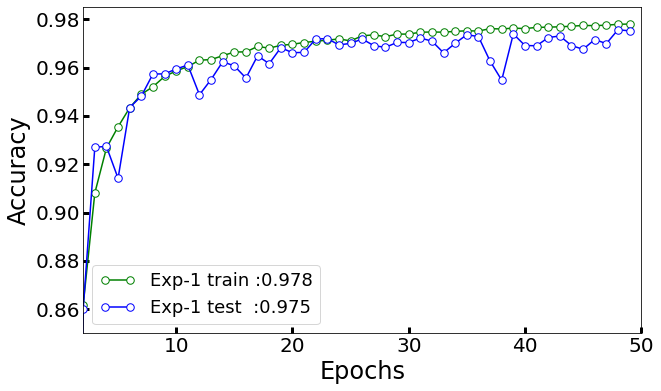

In [380]:
plt.figure( figsize=(10,6))

plt.plot(Experiment1.history['r_square'],'-o',markeredgecolor='g' ,color='g',markersize=7.5,markerfacecolor='w',
         label='Exp-1 train :'+str(str(format(Experiment1.history['r_square'][-1],'.3f'))))
plt.plot(Experiment1.history['val_r_square'],'-o',markeredgecolor='b' ,color='b',markersize=7.5,markerfacecolor='w',
         label='Exp-1 test  :'+str(str(format(Experiment1.history['val_r_square'][-1],'.3f'))))

plt.tick_params(axis='y', direction='in',labelsize=20 ,width=3 ,length=6 ,labeltop=False ,labelbottom=True,
                top=False ,right=False)

plt.tick_params(axis='x', direction='in',labelsize=20 ,width=3 ,length=6 ,labeltop=False ,labelbottom=True,
                top=False ,right=False)

plt.ylabel('Accuracy',fontsize=24)
plt.xlabel('Epochs',fontsize=24)

plt.xlim(2,50)
plt.ylim(0.85,0.985)

plt.legend( loc='best', numpoints=2,fontsize=18, ncol=1)
plt.show()

In [319]:
Experiment3 = model3.fit(Xtrain ,ytrain,batch_size=64,
                            validation_data=(Xval,yval),epochs = Iteration, verbose = 1)
#model1.save('d:/Grav_Mag/Results/Gravity/model/Gravity_AdamANN.h5')

Epoch 1/50
550/550 [==============================] - 4s 6ms/step - loss: 0.0018 - mae: 0.0329 - root_mean_squared_error: 0.0422 - r_square: -11.3088 - val_loss: 1.4517e-04 - val_mae: 0.0099 - val_root_mean_squared_error: 0.0120 - val_r_square: -0.0594
Epoch 2/50
550/550 [==============================] - 3s 6ms/step - loss: 1.7104e-04 - mae: 0.0115 - root_mean_squared_error: 0.0131 - r_square: -0.1791 - val_loss: 9.0523e-05 - val_mae: 0.0084 - val_root_mean_squared_error: 0.0095 - val_r_square: 0.3693
Epoch 3/50
550/550 [==============================] - 3s 6ms/step - loss: 7.5185e-05 - mae: 0.0076 - root_mean_squared_error: 0.0087 - r_square: 0.4817 - val_loss: 6.4511e-05 - val_mae: 0.0070 - val_root_mean_squared_error: 0.0080 - val_r_square: 0.5485
Epoch 4/50
550/550 [==============================] - 3s 6ms/step - loss: 5.2199e-05 - mae: 0.0063 - root_mean_squared_error: 0.0072 - r_square: 0.6402 - val_loss: 4.1478e-05 - val_mae: 0.0055 - val_root_mean_squared_error: 0.0064 - val_r

550/550 [==============================] - 3s 6ms/step - loss: 7.3591e-06 - mae: 0.0022 - root_mean_squared_error: 0.0027 - r_square: 0.9494 - val_loss: 8.6645e-06 - val_mae: 0.0024 - val_root_mean_squared_error: 0.0029 - val_r_square: 0.9393
Epoch 34/50
550/550 [==============================] - 3s 6ms/step - loss: 7.1117e-06 - mae: 0.0022 - root_mean_squared_error: 0.0027 - r_square: 0.9511 - val_loss: 6.4097e-06 - val_mae: 0.0020 - val_root_mean_squared_error: 0.0025 - val_r_square: 0.9565
Epoch 35/50
550/550 [==============================] - 3s 6ms/step - loss: 6.8785e-06 - mae: 0.0021 - root_mean_squared_error: 0.0026 - r_square: 0.9527 - val_loss: 7.5145e-06 - val_mae: 0.0022 - val_root_mean_squared_error: 0.0027 - val_r_square: 0.9467
Epoch 36/50
550/550 [==============================] - 3s 6ms/step - loss: 6.6486e-06 - mae: 0.0021 - root_mean_squared_error: 0.0026 - r_square: 0.9543 - val_loss: 6.5761e-06 - val_mae: 0.0020 - val_root_mean_squared_error: 0.0026 - val_r_square:

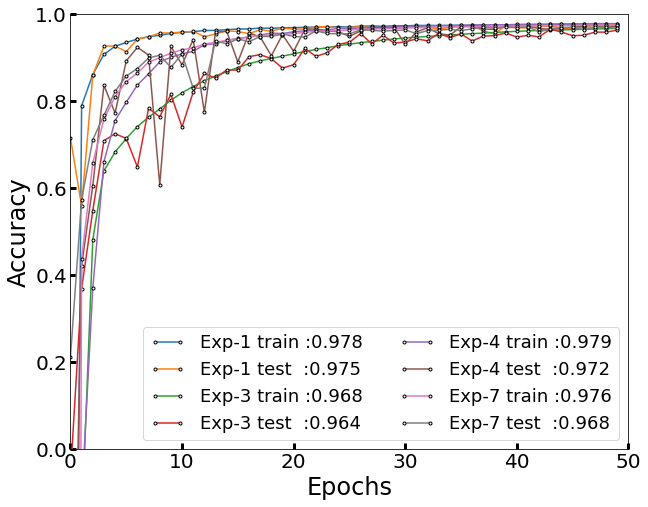

In [374]:
plt.figure( figsize=(10,8))

plt.plot(Experiment1.history['r_square'],'-o',markeredgecolor='k' ,markersize=3,markerfacecolor='w',
         label='Exp-1 train :'+str(str(format(Experiment1.history['r_square'][-1],'.3f'))))
plt.plot(Experiment1.history['val_r_square'],'-o',markeredgecolor='k' ,markersize=3,markerfacecolor='w',
         label='Exp-1 test  :'+str(str(format(Experiment1.history['val_r_square'][-1],'.3f'))))

plt.plot(Experiment3.history['r_square'],'-o',markeredgecolor='k' ,markersize=3,markerfacecolor='w' ,
         label='Exp-3 train :'+str(str(format(Experiment3.history['r_square'][-1],'.3f'))))
plt.plot(Experiment3.history['val_r_square'],'-o',markeredgecolor='k',markersize=3,markerfacecolor='w' ,
         label='Exp-3 test  :'+str(str(format(Experiment3.history['val_r_square'][-1],'.3f'))))

plt.plot(Experiment4.history['r_square'],'-o',markeredgecolor='k' ,markersize=3,markerfacecolor='w' ,
         label='Exp-4 train :'+str(str(format(Experiment4.history['r_square'][-1],'.3f'))))
plt.plot(Experiment4.history['val_r_square'],'-o',markeredgecolor='k' ,markersize=3,markerfacecolor='w' ,
         label='Exp-4 test  :'+str(str(format(Experiment4.history['val_r_square'][-1],'.3f'))))

plt.plot(Experiment7.history['r_square'],'-o',markeredgecolor='k' ,markersize=3,markerfacecolor='w' ,
         label='Exp-7 train :'+str(str(format(Experiment7.history['r_square'][-1],'.3f'))))
plt.plot(Experiment7.history['val_r_square'],'-o',markeredgecolor='k' ,markersize=3,markerfacecolor='w' ,
         label='Exp-7 test  :'+str(str(format(Experiment7.history['val_r_square'][-1],'.3f'))))

plt.tick_params(axis='y', direction='in',labelsize=20 ,width=3 ,length=6 ,labeltop=False ,labelbottom=True ,
                top=False ,right=False)

plt.tick_params(axis='x', direction='in',labelsize=20 ,width=3 ,length=6 ,labeltop=False ,labelbottom=True ,
                top=False ,right=False)

plt.ylabel('Accuracy',fontsize=24)
plt.xlabel('Epochs',fontsize=24)
plt.xlim(0,50)
plt.ylim(0,1)

plt.legend( loc='best', numpoints=2,fontsize=18, ncol=2)
plt.show()

In [ ]:
plt.figure( figsize=(10,6))

plt.plot(Experiment7.history['r_square'],'-o',markeredgecolor='g' ,color='g',markersize=7.5,markerfacecolor='w' ,
         label='Exp-7 train :'+str(str(format(Experiment7.history['r_square'][-1],'.3f'))))
plt.plot(Experiment7.history['val_r_square'],'-o',markeredgecolor='b' ,color='b',markersize=7.5,markerfacecolor='w' ,
         label='Exp-7 test  :'+str(str(format(Experiment7.history['val_r_square'][-1],'.3f'))))

plt.tick_params(axis='y', direction='in',labelsize=20 ,width=3 ,length=6 ,labeltop=False ,labelbottom=True ,
                top=False ,right=False)

plt.tick_params(axis='x', direction='in',labelsize=20 ,width=3 ,length=6 ,labeltop=False ,labelbottom=True ,
                top=False ,right=False)

plt.ylabel('Accuracy',fontsize=24)
plt.xlabel('Epochs',fontsize=24)

plt.xlim(2,50)
plt.ylim(0.66,0.985)

plt.legend( loc='best', numpoints=2,fontsize=18, ncol=1)
plt.show()

plt.figure( figsize=(10,6))

plt.plot(Experiment7.history['loss'],'-o',markeredgecolor='g' ,color='g',markersize=7.5,markerfacecolor='w' ,
         label='Exp-7 train :'+str(str(format(Experiment7.history['loss'][-1],'.6f'))))
plt.plot(Experiment7.history['val_loss'],'-o',markeredgecolor='b' ,color='b',markersize=7.5,markerfacecolor='w' ,
         label='Exp-7 test  :'+str(str(format(Experiment7.history['val_loss'][-1],'.6f'))))

plt.tick_params(axis='y', direction='in',labelsize=20 ,width=3 ,length=6 ,labeltop=False ,labelbottom=True ,
                top=False ,right=False)

plt.tick_params(axis='x', direction='in',labelsize=20 ,width=3 ,length=6 ,labeltop=False ,labelbottom=True ,
                top=False ,right=False)

plt.ylabel('Loss',fontsize=24)
plt.xlabel('Epochs',fontsize=24)

plt.xlim(2,50)
plt.ylim(0.0000,0.00005)

plt.legend( loc='best', numpoints=2,fontsize=18, ncol=1)
plt.show()

plt.figure( figsize=(10,6))

plt.plot(Experiment7.history['mae'],'-o',markeredgecolor='g' ,color='g',markersize=7.5,markerfacecolor='w' ,
         label='Exp-7 train :'+str(str(format(Experiment7.history['mae'][-1],'.4f'))))
plt.plot(Experiment7.history['val_mae'],'-o',markeredgecolor='b' ,color='b',markersize=7.5,markerfacecolor='w' ,
         label='Exp-7 test  :'+str(str(format(Experiment7.history['val_mae'][-1],'.4f'))))

plt.tick_params(axis='y', direction='in',labelsize=20 ,width=3 ,length=6 ,labeltop=False ,labelbottom=True ,
                top=False ,right=False)

plt.tick_params(axis='x', direction='in',labelsize=20 ,width=3 ,length=6 ,labeltop=False ,labelbottom=True ,
                top=False ,right=False)

plt.ylabel('MAE',fontsize=24)
plt.xlabel('Epochs',fontsize=24)

plt.xlim(2,50)
plt.ylim(0.0012,0.0058)

plt.legend( loc='best', numpoints=2,fontsize=18, ncol=1)
plt.show()

plt.figure( figsize=(10,6))

plt.plot(Experiment7.history['root_mean_squared_error'],'-o',markeredgecolor='g' ,color='g',markersize=7.5,markerfacecolor='w' ,
         label='Exp-7 train :'+str(str(format(Experiment7.history['root_mean_squared_error'][-1],'.4f'))))
plt.plot(Experiment7.history['val_root_mean_squared_error'],'-o',markeredgecolor='b' ,color='b',markersize=7.5,markerfacecolor='w' ,
         label='Exp-7 test  :'+str(str(format(Experiment7.history['val_root_mean_squared_error'][-1],'.4f'))))

plt.tick_params(axis='y', direction='in',labelsize=20 ,width=3 ,length=6 ,labeltop=False ,labelbottom=True ,
                top=False ,right=False)

plt.tick_params(axis='x', direction='in',labelsize=20 ,width=3 ,length=6 ,labeltop=False ,labelbottom=True ,
                top=False ,right=False)

plt.ylabel('RMSE',fontsize=24)
plt.xlabel('Epochs',fontsize=24)

plt.xlim(2,50)
plt.ylim(0.0015,0.0073)

plt.legend( loc='best', numpoints=2,fontsize=18, ncol=1)
plt.show()

In [321]:
Experiment4 = model4.fit(Xtrain ,ytrain,batch_size=64,
                            validation_data=(Xval,yval),epochs = Iteration, verbose = 1)
#model1.save('d:/Grav_Mag/Results/Gravity/model/Gravity_AdamANN.h5')

Epoch 1/50
550/550 [==============================] - 5s 8ms/step - loss: 0.0012 - mae: 0.0226 - root_mean_squared_error: 0.0344 - r_square: -7.1372 - val_loss: 2.7217e-04 - val_mae: 0.0143 - val_root_mean_squared_error: 0.0165 - val_r_square: -0.8817
Epoch 2/50
550/550 [==============================] - 4s 7ms/step - loss: 1.6173e-04 - mae: 0.0105 - root_mean_squared_error: 0.0127 - r_square: -0.1166 - val_loss: 8.6097e-05 - val_mae: 0.0077 - val_root_mean_squared_error: 0.0093 - val_r_square: 0.4214
Epoch 3/50
550/550 [==============================] - 4s 8ms/step - loss: 9.1326e-05 - mae: 0.0074 - root_mean_squared_error: 0.0096 - r_square: 0.3699 - val_loss: 5.6763e-05 - val_mae: 0.0062 - val_root_mean_squared_error: 0.0075 - val_r_square: 0.6060
Epoch 4/50
550/550 [==============================] - 4s 8ms/step - loss: 4.9112e-05 - mae: 0.0056 - root_mean_squared_error: 0.0070 - r_square: 0.6614 - val_loss: 2.3478e-05 - val_mae: 0.0039 - val_root_mean_squared_error: 0.0048 - val_r_

550/550 [==============================] - 4s 7ms/step - loss: 3.9012e-06 - mae: 0.0016 - root_mean_squared_error: 0.0020 - r_square: 0.9732 - val_loss: 4.4074e-06 - val_mae: 0.0017 - val_root_mean_squared_error: 0.0021 - val_r_square: 0.9694
Epoch 34/50
550/550 [==============================] - 4s 7ms/step - loss: 3.7894e-06 - mae: 0.0015 - root_mean_squared_error: 0.0019 - r_square: 0.9739 - val_loss: 6.5191e-06 - val_mae: 0.0020 - val_root_mean_squared_error: 0.0026 - val_r_square: 0.9558
Epoch 35/50
550/550 [==============================] - 4s 8ms/step - loss: 3.7469e-06 - mae: 0.0015 - root_mean_squared_error: 0.0019 - r_square: 0.9742 - val_loss: 6.8178e-06 - val_mae: 0.0021 - val_root_mean_squared_error: 0.0026 - val_r_square: 0.9521
Epoch 36/50
550/550 [==============================] - 4s 7ms/step - loss: 3.6760e-06 - mae: 0.0015 - root_mean_squared_error: 0.0019 - r_square: 0.9747 - val_loss: 4.0931e-06 - val_mae: 0.0016 - val_root_mean_squared_error: 0.0020 - val_r_square:

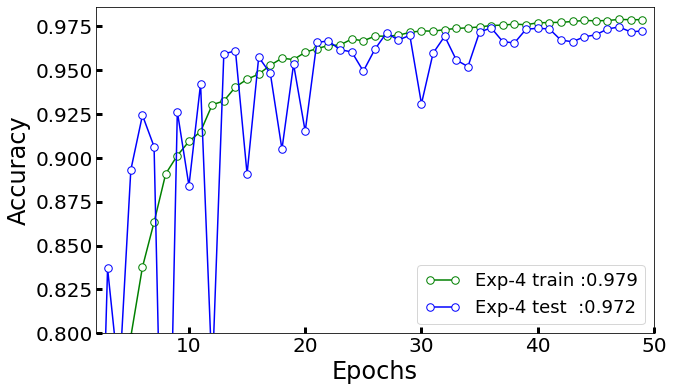

In [382]:
plt.figure( figsize=(10,6))

plt.plot(Experiment4.history['r_square'],'-o',markeredgecolor='g' ,color='g',markersize=7.5,markerfacecolor='w' ,
         label='Exp-4 train :'+str(str(format(Experiment4.history['r_square'][-1],'.3f'))))
plt.plot(Experiment4.history['val_r_square'],'-o',markeredgecolor='b' ,color='b',markersize=7.5,markerfacecolor='w' ,
         label='Exp-4 test  :'+str(str(format(Experiment4.history['val_r_square'][-1],'.3f'))))

plt.tick_params(axis='y', direction='in',labelsize=20 ,width=3 ,length=6 ,labeltop=False ,labelbottom=True ,
                top=False ,right=False)

plt.tick_params(axis='x', direction='in',labelsize=20 ,width=3 ,length=6 ,labeltop=False ,labelbottom=True ,
                top=False ,right=False)

plt.ylabel('Accuracy',fontsize=24)
plt.xlabel('Epochs',fontsize=24)

plt.xlim(2,50)
plt.ylim(0.8,0.986)

plt.legend( loc='best', numpoints=2,fontsize=18, ncol=1)
plt.show()

In [323]:
Experiment7 = model7.fit(Xtrain ,ytrain,batch_size=64,
                            validation_data=(Xval,yval),epochs = Iteration, verbose = 1)
#model1.save('d:/Grav_Mag/Results/Gravity/model/Gravity_AdamANN.h5')

Epoch 1/50
550/550 [==============================] - 3s 5ms/step - loss: 0.0011 - mae: 0.0154 - root_mean_squared_error: 0.0327 - r_square: -6.3465 - val_loss: 1.1203e-04 - val_mae: 0.0084 - val_root_mean_squared_error: 0.0106 - val_r_square: 0.2123
Epoch 2/50
550/550 [==============================] - 3s 6ms/step - loss: 8.0451e-05 - mae: 0.0071 - root_mean_squared_error: 0.0090 - r_square: 0.4384 - val_loss: 6.0920e-05 - val_mae: 0.0062 - val_root_mean_squared_error: 0.0078 - val_r_square: 0.5737
Epoch 3/50
550/550 [==============================] - 3s 5ms/step - loss: 4.9230e-05 - mae: 0.0055 - root_mean_squared_error: 0.0070 - r_square: 0.6583 - val_loss: 4.1315e-05 - val_mae: 0.0051 - val_root_mean_squared_error: 0.0064 - val_r_square: 0.7118
Epoch 4/50
550/550 [==============================] - 3s 5ms/step - loss: 3.4786e-05 - mae: 0.0047 - root_mean_squared_error: 0.0059 - r_square: 0.7594 - val_loss: 3.3270e-05 - val_mae: 0.0046 - val_root_mean_squared_error: 0.0058 - val_r_sq

550/550 [==============================] - 3s 5ms/step - loss: 4.3900e-06 - mae: 0.0017 - root_mean_squared_error: 0.0021 - r_square: 0.9698 - val_loss: 5.4250e-06 - val_mae: 0.0018 - val_root_mean_squared_error: 0.0023 - val_r_square: 0.9628
Epoch 34/50
550/550 [==============================] - 3s 5ms/step - loss: 4.2511e-06 - mae: 0.0016 - root_mean_squared_error: 0.0021 - r_square: 0.9708 - val_loss: 5.4383e-06 - val_mae: 0.0018 - val_root_mean_squared_error: 0.0023 - val_r_square: 0.9636
Epoch 35/50
550/550 [==============================] - 3s 5ms/step - loss: 4.2260e-06 - mae: 0.0016 - root_mean_squared_error: 0.0021 - r_square: 0.9709 - val_loss: 4.8774e-06 - val_mae: 0.0018 - val_root_mean_squared_error: 0.0022 - val_r_square: 0.9659
Epoch 36/50
550/550 [==============================] - 3s 5ms/step - loss: 4.1775e-06 - mae: 0.0016 - root_mean_squared_error: 0.0020 - r_square: 0.9713 - val_loss: 5.4457e-06 - val_mae: 0.0018 - val_root_mean_squared_error: 0.0023 - val_r_square:

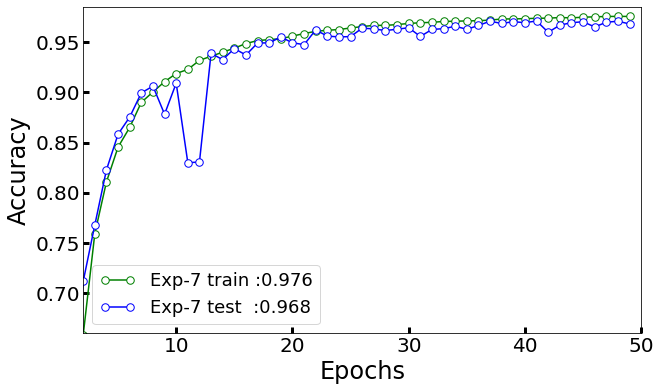

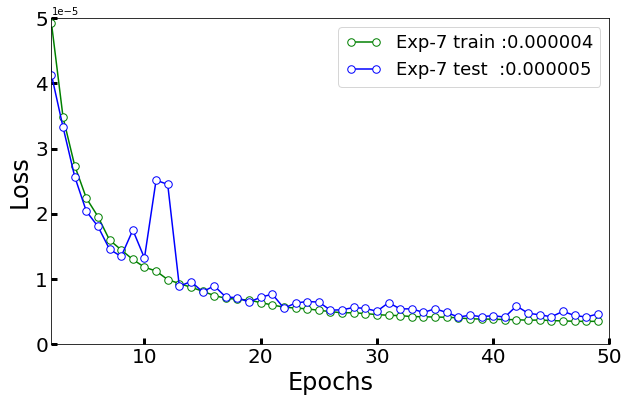

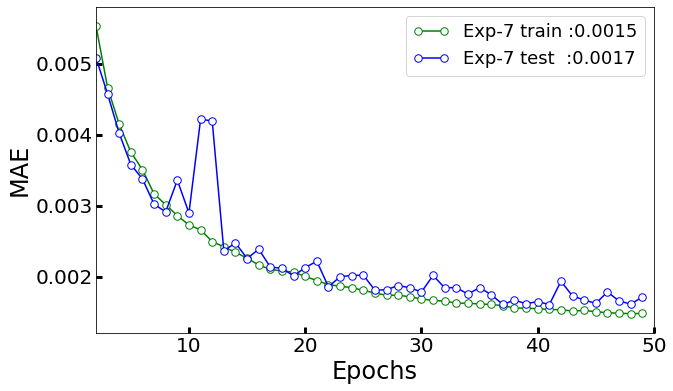

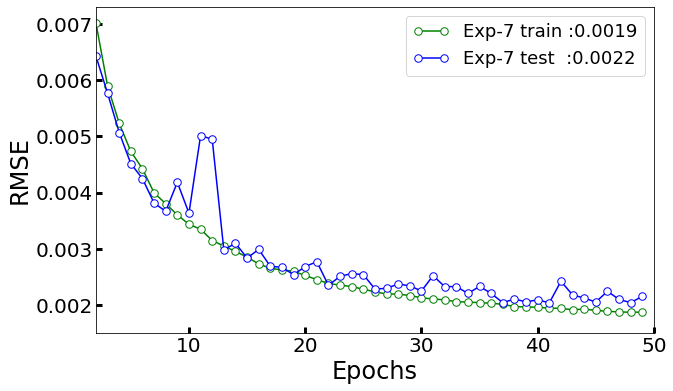

In [350]:
plt.figure( figsize=(10,6))

plt.plot(Experiment7.history['r_square'],'-o',markeredgecolor='g' ,color='g',markersize=7.5,markerfacecolor='w' ,
         label='Exp-7 train :'+str(str(format(Experiment7.history['r_square'][-1],'.3f'))))
plt.plot(Experiment7.history['val_r_square'],'-o',markeredgecolor='b' ,color='b',markersize=7.5,markerfacecolor='w' ,
         label='Exp-7 test  :'+str(str(format(Experiment7.history['val_r_square'][-1],'.3f'))))

plt.tick_params(axis='y', direction='in',labelsize=20 ,width=3 ,length=6 ,labeltop=False ,labelbottom=True ,
                top=False ,right=False)

plt.tick_params(axis='x', direction='in',labelsize=20 ,width=3 ,length=6 ,labeltop=False ,labelbottom=True ,
                top=False ,right=False)

plt.ylabel('Accuracy',fontsize=24)
plt.xlabel('Epochs',fontsize=24)

plt.xlim(2,50)
plt.ylim(0.66,0.985)

plt.legend( loc='best', numpoints=2,fontsize=18, ncol=1)
plt.show()

plt.figure( figsize=(10,6))

plt.plot(Experiment7.history['loss'],'-o',markeredgecolor='g' ,color='g',markersize=7.5,markerfacecolor='w' ,
         label='Exp-7 train :'+str(str(format(Experiment7.history['loss'][-1],'.6f'))))
plt.plot(Experiment7.history['val_loss'],'-o',markeredgecolor='b' ,color='b',markersize=7.5,markerfacecolor='w' ,
         label='Exp-7 test  :'+str(str(format(Experiment7.history['val_loss'][-1],'.6f'))))

plt.tick_params(axis='y', direction='in',labelsize=20 ,width=3 ,length=6 ,labeltop=False ,labelbottom=True ,
                top=False ,right=False)

plt.tick_params(axis='x', direction='in',labelsize=20 ,width=3 ,length=6 ,labeltop=False ,labelbottom=True ,
                top=False ,right=False)

plt.ylabel('Loss',fontsize=24)
plt.xlabel('Epochs',fontsize=24)

plt.xlim(2,50)
plt.ylim(0.0000,0.00005)

plt.legend( loc='best', numpoints=2,fontsize=18, ncol=1)
plt.show()

plt.figure( figsize=(10,6))

plt.plot(Experiment7.history['mae'],'-o',markeredgecolor='g' ,color='g',markersize=7.5,markerfacecolor='w' ,
         label='Exp-7 train :'+str(str(format(Experiment7.history['mae'][-1],'.4f'))))
plt.plot(Experiment7.history['val_mae'],'-o',markeredgecolor='b' ,color='b',markersize=7.5,markerfacecolor='w' ,
         label='Exp-7 test  :'+str(str(format(Experiment7.history['val_mae'][-1],'.4f'))))

plt.tick_params(axis='y', direction='in',labelsize=20 ,width=3 ,length=6 ,labeltop=False ,labelbottom=True ,
                top=False ,right=False)

plt.tick_params(axis='x', direction='in',labelsize=20 ,width=3 ,length=6 ,labeltop=False ,labelbottom=True ,
                top=False ,right=False)

plt.ylabel('MAE',fontsize=24)
plt.xlabel('Epochs',fontsize=24)

plt.xlim(2,50)
plt.ylim(0.0012,0.0058)

plt.legend( loc='best', numpoints=2,fontsize=18, ncol=1)
plt.show()

plt.figure( figsize=(10,6))

plt.plot(Experiment7.history['root_mean_squared_error'],'-o',markeredgecolor='g' ,color='g',markersize=7.5,markerfacecolor='w' ,
         label='Exp-7 train :'+str(str(format(Experiment7.history['root_mean_squared_error'][-1],'.4f'))))
plt.plot(Experiment7.history['val_root_mean_squared_error'],'-o',markeredgecolor='b' ,color='b',markersize=7.5,markerfacecolor='w' ,
         label='Exp-7 test  :'+str(str(format(Experiment7.history['val_root_mean_squared_error'][-1],'.4f'))))

plt.tick_params(axis='y', direction='in',labelsize=20 ,width=3 ,length=6 ,labeltop=False ,labelbottom=True ,
                top=False ,right=False)

plt.tick_params(axis='x', direction='in',labelsize=20 ,width=3 ,length=6 ,labeltop=False ,labelbottom=True ,
                top=False ,right=False)

plt.ylabel('RMSE',fontsize=24)
plt.xlabel('Epochs',fontsize=24)

plt.xlim(2,50)
plt.ylim(0.0015,0.0073)

plt.legend( loc='best', numpoints=2,fontsize=18, ncol=1)
plt.show()

In [37]:
XTest=SeiSamples.drop([0, 1], axis=1)
XTestV = normalize(XTest, axis=1)
print(XTestV.shape)

yTest=SPorSamples.drop([0, 1], axis=1)
print(yTest.shape)

(28301, 76)
(28301, 76)


In [ ]:
yTest,yhatExp1

In [38]:
yhatExp1 = model1.predict(XTestV)
print('Predicted: %s' % yhatExp1)

885/885 [==============================] - 2s 2ms/step
Predicted: [[0.34928495 0.36315286 0.36205262 ... 0.31163496 0.31269652 0.3142612 ]
 [0.32682294 0.32423553 0.32005978 ... 0.28664795 0.27653116 0.26944357]
 [0.3303718  0.32597184 0.31599095 ... 0.27445173 0.27547067 0.27753493]
 ...
 [0.31780976 0.3209429  0.32853538 ... 0.27526608 0.2784936  0.28018177]
 [0.3566009  0.36413312 0.3550896  ... 0.30894256 0.30257207 0.3021011 ]
 [0.3557195  0.36345333 0.35429555 ... 0.3085594  0.3037076  0.3028386 ]]


In [39]:
yhatExp3 = model3.predict(XTestV)
print('Predicted: %s' % yhatExp3)

885/885 [==============================] - 2s 2ms/step
Predicted: [[0.3460706  0.3606537  0.362114   ... 0.3103559  0.3088426  0.31117338]
 [0.32493773 0.32189202 0.31640285 ... 0.2873261  0.27781543 0.2715289 ]
 [0.32588965 0.32324293 0.3136571  ... 0.2741392  0.27561998 0.27816802]
 ...
 [0.3152053  0.3203071  0.32949224 ... 0.27629963 0.279162   0.2812912 ]
 [0.35386848 0.36094046 0.35194612 ... 0.30740502 0.2993185  0.3004496 ]
 [0.35229933 0.3606364  0.35209867 ... 0.30910558 0.3035314  0.30224806]]


In [40]:
yhatExp4 = model4.predict(XTestV)
print('Predicted: %s' % yhatExp4)

885/885 [==============================] - 2s 2ms/step
Predicted: [[0.347381   0.36037356 0.36179087 ... 0.3117119  0.31003594 0.31250432]
 [0.3259825  0.32251433 0.3178261  ... 0.28510264 0.27599075 0.26992255]
 [0.32721952 0.32326987 0.31484103 ... 0.2736481  0.27331513 0.2756343 ]
 ...
 [0.31598645 0.32287416 0.3322029  ... 0.27688876 0.27970842 0.28151208]
 [0.35286117 0.36041862 0.35325146 ... 0.30817598 0.3014796  0.30366024]
 [0.3519722  0.36194384 0.35502088 ... 0.30999327 0.30193752 0.30245078]]


In [41]:
yhatExp7 = model7.predict(XTestV)
print('Predicted: %s' % yhatExp7)

885/885 [==============================] - 2s 2ms/step
Predicted: [[0.342964   0.35778633 0.3597761  ... 0.31066525 0.30910286 0.31120545]
 [0.32440424 0.321811   0.31651837 ... 0.28671217 0.27683318 0.2690154 ]
 [0.32625547 0.32340202 0.31445196 ... 0.2738483  0.27404493 0.2748193 ]
 ...
 [0.3161982  0.3205422  0.3298018  ... 0.27615297 0.28044915 0.282013  ]
 [0.35194796 0.35836753 0.35052162 ... 0.30910486 0.30153456 0.301371  ]
 [0.35231584 0.3594902  0.35311067 ... 0.30697048 0.29970434 0.29830077]]


In [60]:
ZDepth = np.arange(624, 924, 3.99)
ZDepth.shape

TruePorosity=pd.DataFrame(yTest).T
TruePorosity['MeanReal']=mean(TruePorosity, axis=1)
TruePorosity['DEPTH']=ZDepth
print(TruePorosity.shape)

PredPorosityExp1=pd.DataFrame(yhatExp1).T
PredPorosityVExp1=PredPorosityExp1
PredPorosityVExp1['SD']=std(PredPorosityExp1, axis=1)
PredPorosityVExp1['MeanPred']=mean(PredPorosityExp1, axis=1)
PredPorosityVExp1['DEPTH']=ZDepth
print(PredPorosityVExp1.shape)

PredPorosityExp3=pd.DataFrame(yhatExp3).T
PredPorosityVExp3=PredPorosityExp3
PredPorosityVExp3['SD']=std(PredPorosityExp3, axis=1)
PredPorosityVExp3['MeanPred']=mean(PredPorosityExp3, axis=1)
print(PredPorosityVExp3.shape)

PredPorosityExp4=pd.DataFrame(yhatExp4).T
PredPorosityVExp4=PredPorosityExp4
PredPorosityVExp4['SD']=std(PredPorosityExp4, axis=1)
PredPorosityVExp4['MeanPred']=mean(PredPorosityExp4, axis=1)
print(PredPorosityVExp4.shape)

PredPorosityExp7=pd.DataFrame(yhatExp7).T
PredPorosityVExp7=PredPorosityExp7
PredPorosityVExp7['SD']=std(PredPorosityExp7, axis=1)
PredPorosityVExp7['MeanPred']=mean(PredPorosityExp7, axis=1)
print(PredPorosityVExp7.shape)

(76, 28303)
(76, 28304)
(76, 28303)
(76, 28303)
(76, 28303)


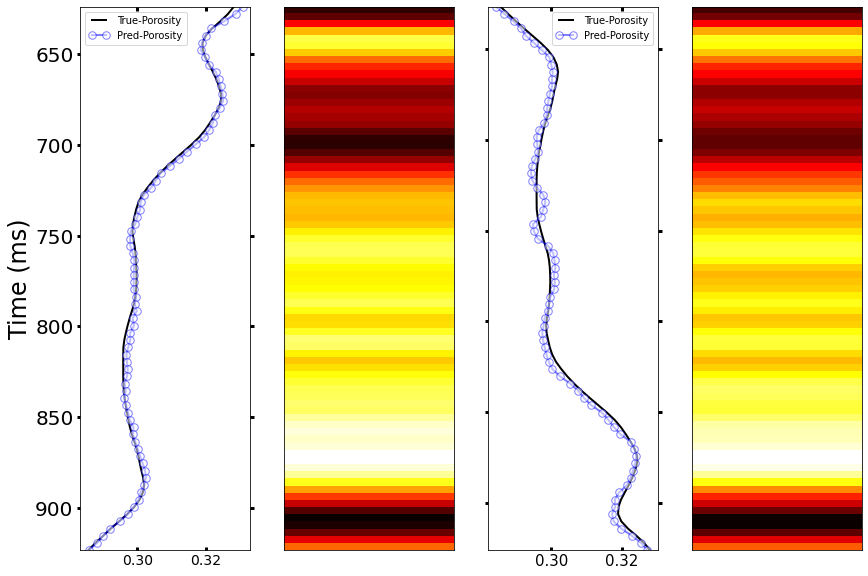

In [158]:
f, ax = plt.subplots(nrows=1, ncols=4, figsize=(14, 10))

# PLOT #1
ax[0].set_ylim(TruePorosity['DEPTH'].min(),TruePorosity['DEPTH'].max())
ax[0].invert_yaxis()
ax[0].set_ylabel("Time (ms)",fontsize=24)

ax[0].plot(TruePorosity['MeanReal'], TruePorosity['DEPTH'], '-', color='k' ,linewidth=2 ,label='True-Porosity')
ax[0].plot(PredPorosityVExp1['MeanPred'], PredPorosityVExp1['DEPTH'], '-o', color='b',linewidth=2 ,label='Pred-Porosity',
           alpha=0.5,markersize=7.5,markerfacecolor='w')

ax[0].tick_params(axis='y' ,width=3 ,labelsize=20 ,right=True)
ax[0].tick_params(axis='x', direction='in',labelsize=14 ,width=3 ,labeltop=False ,labelbottom=True ,top=True )
ax[0].legend( loc='best', numpoints = 2 )

cluster1=np.repeat(np.expand_dims(PredPorosityVExp1['SD'].values,1), 10, 1)
im=ax[1].imshow(cluster1, interpolation='none', aspect='auto',cmap='hot_r',vmin=PredPorosityVExp1['SD'].min(),
                vmax=PredPorosityVExp1['SD'].max())  
ax[1].tick_params(axis='both' ,width=3 ,labelsize=12 ,right=False, top=False,bottom=False, left=False,labelbottom=False,
                 labelleft=False)

# PLOT #2

ax[2].set_ylim(TruePorosity['DEPTH'].min(),TruePorosity['DEPTH'].max())
ax1.invert_yaxis()

ax[2].plot(TruePorosity['MeanReal'], TruePorosity['DEPTH'], '-', color='k' ,linewidth=2 ,label='True-Porosity')
ax[2].plot(PredPorosityVExp3['MeanPred'], TruePorosity['DEPTH'], '-o', color='b',linewidth=2 ,label='Pred-Porosity',
           alpha=0.5,markersize=7.5,markerfacecolor='w')

ax[2].tick_params(axis='y' ,width=3 ,labelsize=20 ,right=True, labelrotation=90)
ax[2].tick_params(axis='x', direction='in',labelsize=15 ,width=3 ,labeltop=False ,labelbottom=True ,top=True )
ax[2].legend( loc='best', numpoints = 2)
ax[2].set_yticklabels([])
#ax[2].grid()

cluster2=np.repeat(np.expand_dims(PredPorosityVExp3['SD'].values,1), 10, 1)
im=ax[3].imshow(cluster2, interpolation='none', aspect='auto',cmap='hot_r',vmin=PredPorosityVExp3['SD'].min(),
                vmax=PredPorosityVExp3['SD'].max())  
ax[3].tick_params(axis='both' ,width=3 ,labelsize=12 ,right=False, top=False,bottom=False, left=False,labelbottom=False,
                 labelleft=False)

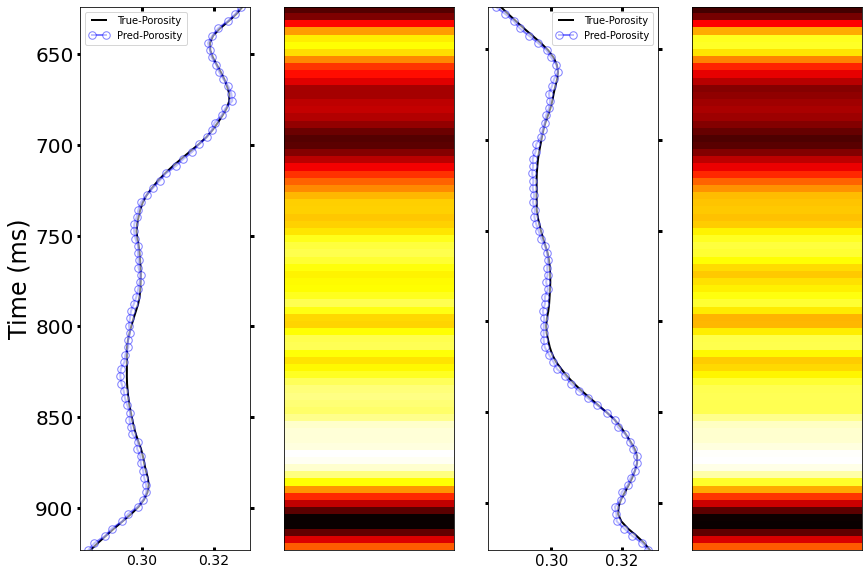

In [157]:
f, ax = plt.subplots(nrows=1, ncols=4, figsize=(14, 10))

# PLOT #1
ax[0].set_ylim(TruePorosity['DEPTH'].min(),TruePorosity['DEPTH'].max())
ax[0].invert_yaxis()
ax[0].set_ylabel("Time (ms)",fontsize=24)

ax[0].plot(TruePorosity['MeanReal'], TruePorosity['DEPTH'], '-', color='k' ,linewidth=2 ,label='True-Porosity')
ax[0].plot(PredPorosityVExp4['MeanPred'], TruePorosity['DEPTH'], '-o', color='b',linewidth=2 ,label='Pred-Porosity',
           alpha=0.5,markersize=7.5,markerfacecolor='w')

ax[0].tick_params(axis='y' ,width=3 ,labelsize=20 ,right=True)
ax[0].tick_params(axis='x', direction='in',labelsize=14 ,width=3 ,labeltop=False ,labelbottom=True ,top=True )
ax[0].legend( loc='best', numpoints = 2 )

cluster1=np.repeat(np.expand_dims(PredPorosityVExp4['SD'].values,1), 10, 1)
im=ax[1].imshow(cluster1, interpolation='none', aspect='auto',cmap='hot_r',vmin=PredPorosityVExp4['SD'].min(),
                vmax=PredPorosityVExp4['SD'].max())  
ax[1].tick_params(axis='both' ,width=3 ,labelsize=12 ,right=False, top=False,bottom=False, left=False,labelbottom=False,
                 labelleft=False)

# PLOT #2

ax[2].set_ylim(TruePorosity['DEPTH'].min(),TruePorosity['DEPTH'].max())
ax1.invert_yaxis()

ax[2].plot(TruePorosity['MeanReal'], TruePorosity['DEPTH'], '-', color='k' ,linewidth=2 ,label='True-Porosity')
ax[2].plot(PredPorosityVExp7['MeanPred'], TruePorosity['DEPTH'], '-o', color='b',linewidth=2 ,label='Pred-Porosity',
           alpha=0.5,markersize=7.5,markerfacecolor='w')

ax[2].tick_params(axis='y' ,width=3 ,labelsize=20 ,right=True, labelrotation=90)
ax[2].tick_params(axis='x', direction='in',labelsize=15 ,width=3 ,labeltop=False ,labelbottom=True ,top=True )
ax[2].legend( loc='best', numpoints = 2)
ax[2].set_yticklabels([])
#ax[2].grid()

cluster2=np.repeat(np.expand_dims(PredPorosityVExp7['SD'].values,1), 10, 1)
im=ax[3].imshow(cluster2, interpolation='none', aspect='auto',cmap='hot_r',vmin=PredPorosityVExp7['SD'].min(),
                vmax=PredPorosityVExp7['SD'].max())  
ax[3].tick_params(axis='both' ,width=3 ,labelsize=12 ,right=False, top=False,bottom=False, left=False,labelbottom=False,
                 labelleft=False)

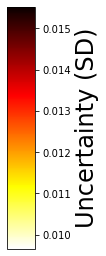

In [417]:
import matplotlib as mpl
fig2, ax2 = plt.subplots(figsize=(0.5,12))
fig2.subplots_adjust(bottom=0.6)

cmap2 = mpl.cm.hot_r 
norm2 = mpl.colors.Normalize(vmin=PredPorosityVExp7['SD'].min(),vmax=PredPorosityVExp7['SD'].max())

CBAR2= fig2.colorbar(mpl.cm.ScalarMappable(norm=norm2, cmap=cmap2),cax=ax2, orientation='vertical')
#TICKS=[0.0002,0.0004,0.0006,0.0008,0.0010,0.0012]
#CBAR2.set_ticks(TICKS)
#CBAR2.set_ticklabels(DFC['Mean-SD'])
CBAR2.set_label('Uncertainty (SD)',fontsize=24)

plt.show()

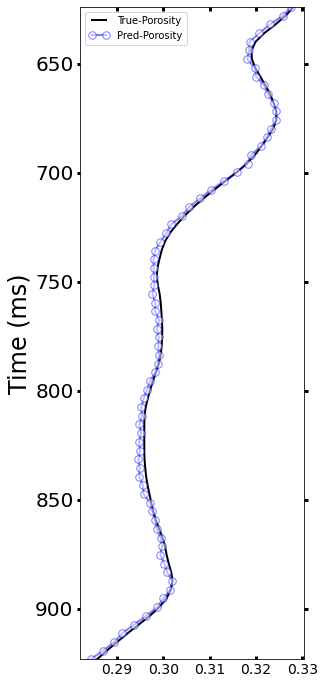

In [411]:
f, ax = plt.subplots( figsize=(4, 12))

ax.set_ylim(TruePorosity['DEPTH'].min(),TruePorosity['DEPTH'].max())
ax.invert_yaxis()
ax.set_ylabel("Time (ms)",fontsize=24)

ax.plot(TruePorosity['MeanReal'], TruePorosity['DEPTH'], '-', color='k' ,linewidth=2 ,label='True-Porosity')
ax.plot(PredPorosityVExp7['MeanPred'], TruePorosity['DEPTH'], '-o', color='b',linewidth=2 ,label='Pred-Porosity',
           alpha=0.5,markersize=7.5,markerfacecolor='w')

ax.tick_params(axis='y' ,width=3 ,labelsize=20 ,right=True)
ax.tick_params(axis='x', direction='in',labelsize=14 ,width=3 ,labeltop=False ,labelbottom=True ,top=True )
ax.legend( loc='best', numpoints = 2 )

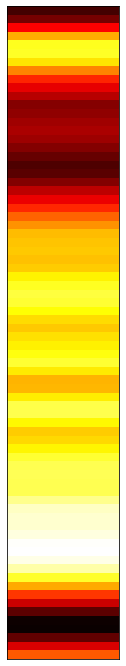

In [414]:
f, ax = plt.subplots( figsize=(2, 12))
cluster1=np.repeat(np.expand_dims(PredPorosityVExp7['SD'].values,1), 10, 1)
im=ax.imshow(cluster1, interpolation='none', aspect='auto',cmap='hot_r',vmin=PredPorosityVExp7['SD'].min(),
                vmax=PredPorosityVExp7['SD'].max())  
ax.tick_params(axis='both' ,width=3 ,labelsize=12 ,right=False, top=False,bottom=False, left=False,labelbottom=False,
                 labelleft=False)

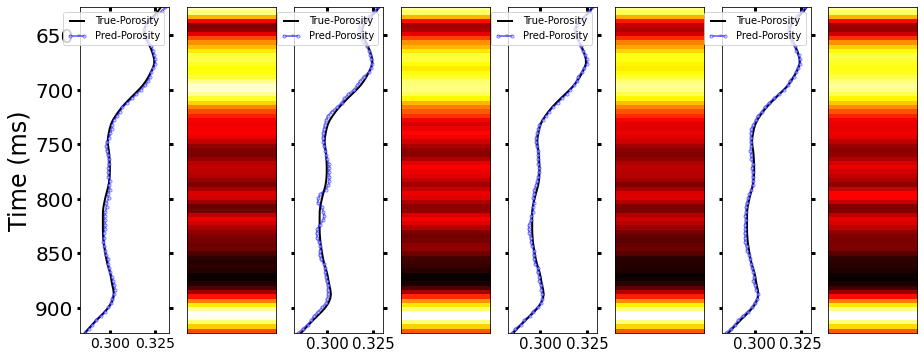

In [387]:
f, ax = plt.subplots(nrows=1, ncols=8, figsize=(15, 6))
#fig = plt.figure(figsize=(20, 10)) # create the canvas for plotting

# PLOT #1
ax[0].set_ylim(TruePorosity['DEPTH'].min(),TruePorosity['DEPTH'].max())
ax[0].invert_yaxis()
ax[0].set_ylabel("Time (ms)",fontsize=24)

ax[0].plot(TruePorosity['MeanReal'], TruePorosity['DEPTH'], '-', color='k' ,linewidth=2 ,label='True-Porosity')
ax[0].plot(PredPorosityVExp1['MeanPred'], PredPorosityVExp1['DEPTH'], '-o', color='b',linewidth=2 ,label='Pred-Porosity',
           alpha=0.5,markersize=3,markerfacecolor='w')

ax[0].tick_params(axis='y' ,width=3 ,labelsize=20 ,right=True)
ax[0].tick_params(axis='x', direction='in',labelsize=14 ,width=3 ,labeltop=False ,labelbottom=True ,top=True )
ax[0].legend( loc='best', numpoints = 2 )

cluster1=np.repeat(np.expand_dims(PredPorosityVExp1['SD'].values,1), 10, 1)
im=ax[1].imshow(cluster1, interpolation='none', aspect='auto',cmap='hot',vmin=PredPorosityVExp1['SD'].min(),
                vmax=PredPorosityVExp1['SD'].max())  
ax[1].tick_params(axis='both' ,width=3 ,labelsize=12 ,right=False, top=False,bottom=False, left=False,labelbottom=False,
                 labelleft=False)

# PLOT #2

ax[2].set_ylim(TruePorosity['DEPTH'].min(),TruePorosity['DEPTH'].max())
ax[2].invert_yaxis()

ax[2].plot(TruePorosity['MeanReal'], TruePorosity['DEPTH'], '-', color='k' ,linewidth=2 ,label='True-Porosity')
ax[2].plot(PredPorosityVExp3['MeanPred'], TruePorosity['DEPTH'], '-o', color='b',linewidth=2 ,label='Pred-Porosity',
           alpha=0.5,markersize=3,markerfacecolor='w')

ax[2].tick_params(axis='y' ,width=3 ,labelsize=20 ,right=True, labelrotation=90)
ax[2].tick_params(axis='x', direction='in',labelsize=15 ,width=3 ,labeltop=False ,labelbottom=True ,top=True )
ax[2].legend( loc='best', numpoints = 2)
ax[2].set_yticklabels([])


cluster2=np.repeat(np.expand_dims(PredPorosityVExp3['SD'].values,1), 10, 1)
im=ax[3].imshow(cluster2, interpolation='none', aspect='auto',cmap='hot',vmin=PredPorosityVExp3['SD'].min(),
                vmax=PredPorosityVExp3['SD'].max())  
ax[3].tick_params(axis='both' ,width=3 ,labelsize=12 ,right=False, top=False,bottom=False, left=False,labelbottom=False,
                 labelleft=False)


# PLOT #3
ax[4].set_ylim(TruePorosity['DEPTH'].min(),TruePorosity['DEPTH'].max())
ax[4].invert_yaxis()

ax[4].plot(TruePorosity['MeanReal'], TruePorosity['DEPTH'], '-', color='k' ,linewidth=2 ,label='True-Porosity')
ax[4].plot(PredPorosityVExp4['MeanPred'], TruePorosity['DEPTH'], '-o', color='b',linewidth=2 ,label='Pred-Porosity',
           alpha=0.5,markersize=3,markerfacecolor='w')

ax[4].tick_params(axis='y' ,width=3 ,labelsize=20 ,right=True, labelrotation=90)
ax[4].tick_params(axis='x', direction='in',labelsize=15 ,width=3 ,labeltop=False ,labelbottom=True ,top=True )
ax[4].legend( loc='best', numpoints = 2)
ax[4].set_yticklabels([])

cluster2=np.repeat(np.expand_dims(PredPorosityVExp4['SD'].values,1), 10, 1)
im=ax[5].imshow(cluster2, interpolation='none', aspect='auto',cmap='hot',vmin=PredPorosityVExp4['SD'].min(),
                vmax=PredPorosityVExp4['SD'].max())  
ax[5].tick_params(axis='both' ,width=3 ,labelsize=12 ,right=False, top=False,bottom=False, left=False,labelbottom=False,
                 labelleft=False)

# PLOT #4
ax[6].set_ylim(TruePorosity['DEPTH'].min(),TruePorosity['DEPTH'].max())
ax[6].invert_yaxis()

ax[6].plot(TruePorosity['MeanReal'], TruePorosity['DEPTH'], '-', color='k' ,linewidth=2 ,label='True-Porosity')
ax[6].plot(PredPorosityVExp7['MeanPred'], TruePorosity['DEPTH'], '-o', color='b',linewidth=2 ,label='Pred-Porosity',
           alpha=0.5,markersize=3,markerfacecolor='w')

ax[6].tick_params(axis='y' ,width=3 ,labelsize=20 ,right=True, labelrotation=90)
ax[6].tick_params(axis='x', direction='in',labelsize=15 ,width=3 ,labeltop=False ,labelbottom=True ,top=True )
ax[6].legend( loc='best', numpoints = 2)
ax[6].set_yticklabels([])

cluster2=np.repeat(np.expand_dims(PredPorosityVExp7['SD'].values,1), 10, 1)
im=ax[7].imshow(cluster2, interpolation='none', aspect='auto',cmap='hot',vmin=PredPorosityVExp7['SD'].min(),
                vmax=PredPorosityVExp7['SD'].max())  
ax[7].tick_params(axis='both' ,width=3 ,labelsize=12 ,right=False, top=False,bottom=False, left=False,labelbottom=False,
                 labelleft=False)

In [180]:
XY=Seisdf[[0,1]]
#XY

In [181]:
Seisdf

,0,1,2,3,4,5,6,7,8,9,...,68,69,70,71,72,73,74,75,76,77
0,400.0,750.0,1656.0,8068.0,3195.0,-1685.0,1707.0,4408.0,1063.0,-1941.0,...,4473.0,3927.0,-2623.0,-2860.0,4449.0,6420.0,150.0,-2786.0,1416.0,2299.0
1,400.0,751.0,4471.0,9707.0,1790.0,-2814.0,2589.0,4529.0,-104.0,-2018.0,...,3938.0,3351.0,-2277.0,-1843.0,5376.0,5870.0,-2056.0,-4056.0,2116.0,2690.0
2,400.0,752.0,5381.0,9214.0,-690.0,-2437.0,4860.0,3947.0,-1625.0,-1260.0,...,3744.0,3443.0,-1186.0,-668.0,5069.0,4665.0,-1918.0,-2564.0,2315.0,1504.0
3,400.0,753.0,6218.0,8487.0,-789.0,-998.0,4872.0,3272.0,-546.0,-969.0,...,1998.0,2207.0,282.0,1501.0,4272.0,1977.0,-2810.0,-1324.0,3351.0,1125.0
4,400.0,754.0,9936.0,7602.0,-1631.0,228.0,5254.0,2533.0,-1019.0,-1367.0,...,2187.0,1476.0,-426.0,1051.0,4155.0,2259.0,-2440.0,-1616.0,2087.0,325.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40396,600.0,946.0,-585.0,2731.0,2339.0,-4861.0,-3640.0,5345.0,4753.0,-2615.0,...,109.0,883.0,-471.0,-1858.0,-1832.0,70.0,3523.0,4102.0,-612.0,-4306.0
40397,600.0,947.0,-917.0,4440.0,4416.0,-4828.0,-4994.0,4457.0,4578.0,-1814.0,...,-228.0,712.0,-207.0,-1075.0,-1651.0,-555.0,3771.0,4500.0,-2470.0,-6176.0
40398,600.0,948.0,-834.0,6179.0,4310.0,-6756.0,-5422.0,5164.0,4267.0,-1968.0,...,-8.0,1220.0,78.0,-1297.0,-1896.0,-356.0,3952.0,3690.0,-3408.0,-5108.0
40399,600.0,949.0,221.0,4244.0,1505.0,-6901.0,-3344.0,6195.0,3707.0,-2493.0,...,1077.0,1537.0,-660.0,-1784.0,-1417.0,-14.0,3249.0,3073.0,-2546.0,-3849.0


In [182]:
F3Data=Seisdf.drop([0, 1], axis=1)
F3DataNorm=normalize(F3Data, axis=1)
F3DataNorm#.shape()

,2,3,4,5,6,7,8,9,10,11,...,68,69,70,71,72,73,74,75,76,77
0,0.091336,0.444987,0.176219,-0.092935,0.094149,0.243121,0.058629,-0.107055,-0.112295,-0.132591,...,0.246706,0.216592,-0.144670,-0.157742,0.245382,0.354092,0.008273,-0.153660,0.078099,0.126800
1,0.224336,0.487057,0.089815,-0.141195,0.129905,0.227247,-0.005218,-0.101255,-0.077020,-0.154040,...,0.197593,0.168139,-0.114250,-0.092474,0.269746,0.294532,-0.103162,-0.203513,0.106172,0.134973
2,0.282216,0.483245,-0.036188,-0.127813,0.254891,0.207008,-0.085226,-0.066083,-0.027377,-0.168040,...,0.196361,0.180574,-0.062202,-0.035034,0.265853,0.244664,-0.100593,-0.134474,0.121414,0.078880
3,0.367624,0.501773,-0.046648,-0.059004,0.288045,0.193449,-0.032281,-0.057290,-0.128828,-0.199834,...,0.118127,0.130483,0.016673,0.088743,0.252572,0.116885,-0.166134,-0.078278,0.198120,0.066513
4,0.542535,0.415092,-0.089057,0.012449,0.286884,0.138309,-0.055640,-0.074642,-0.153434,-0.234684,...,0.119417,0.080594,-0.023261,0.057388,0.226875,0.123348,-0.133231,-0.088238,0.113956,0.017746
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40396,-0.034640,0.161713,0.138501,-0.287838,-0.215538,0.316498,0.281443,-0.154844,-0.134830,0.088288,...,0.006454,0.052286,-0.027890,-0.110019,-0.108480,0.004145,0.208610,0.242895,-0.036239,-0.254975
40397,-0.047539,0.230180,0.228936,-0.250295,-0.258900,0.231061,0.237334,-0.094042,-0.055575,0.048524,...,-0.011820,0.036912,-0.010731,-0.055730,-0.085592,-0.028772,0.195497,0.233290,-0.128050,-0.320178
40398,-0.041370,0.306507,0.213796,-0.335129,-0.268956,0.256158,0.211663,-0.097622,-0.016221,0.041817,...,-0.000397,0.060518,0.003869,-0.064337,-0.094050,-0.017659,0.196037,0.183041,-0.169053,-0.253380
40399,0.012532,0.240666,0.085345,-0.391337,-0.189629,0.351302,0.210214,-0.141371,-0.007032,0.078426,...,0.061074,0.087159,-0.037427,-0.101166,-0.080354,-0.000794,0.184242,0.174262,-0.144377,-0.218267


In [423]:
model4.save('Test/F3PorosityPredictionModel.h5')
#model1.save('d:/Grav_Mag/Results/Gravity/model/Gravity_AdamANN.h5')

In [177]:
F3PredPor=model4.predict(F3DataNorm)

1263/1263 [==============================] - 2s 2ms/step


In [178]:
F3PredPor.shape

(40401, 76)

In [201]:
F3Prediction = F3PredPor.reshape((201,201,76))
mat_sliceF3Por = ReshapedDataPor[2:] # Simple indexing
TransposedDataF3Por=mat_sliceF3Por.T
FlippedDataF3Por=np.flip(TransposedDataF3Por)

print ('ReshapedData shape is:', mat_sliceF3Por.shape)
print ('Transposed&FlippedData shape is:', FlippedDataF3Por.shape)

VolumeF3Por = pv.UniformGrid()
VolumeF3Por.dimensions = FlippedDataF3Por.shape

VolumeF3Por.origin = (0 , 0 , 0)
VolumeF3Por.spacing = (1, 1, 3)  # These are the cell sizes along each axis
VolumeF3Por.point_data["Porosity (Fraction)"] = FlippedDataF3Por.flatten(order='F').T #'C', 'F', 'A', or 'K'

ReshapedData shape is: (76, 201, 201)
Transposed&FlippedData shape is: (201, 201, 76)


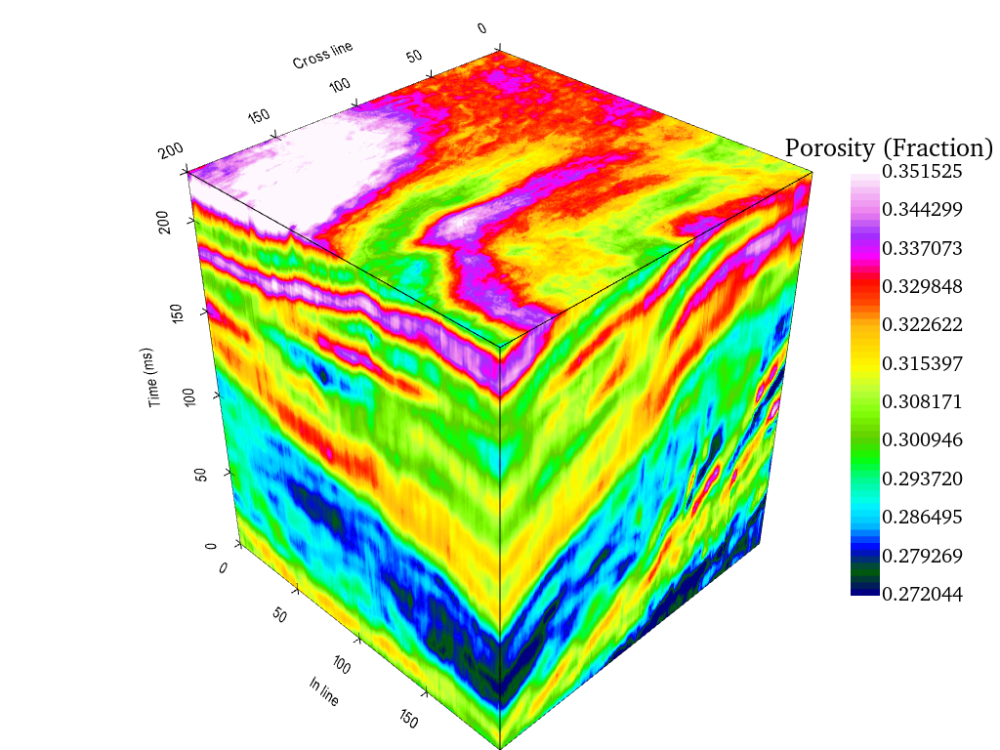

In [202]:
pv.set_jupyter_backend('static') 
pv.global_theme.background = 'white' 

ValueF3Por = dict(height=0.6, vertical=True  ,position_x=0.85, position_y=0.20 ,
             title_font_size=26, label_font_size=20 ,shadow=False ,n_labels=12 ,
             italic=False ,fmt="%.6f" ,font_family="times",color='k')

pF3Por = pv.Plotter()


pF3Por.add_mesh(VolumeF3Por ,clim=[0.2720436,0.3515245] ,flip_scalars=False ,cmap='gist_ncar' ,lighting=False ,
               scalar_bar_args=ValuePor1 ,render_points_as_spheres=False ,render_lines_as_tubes=True ,
               use_transparency=False ,smooth_shading=True ,annotations=False ,pbr=True ,roughness=0.5 ,
               edge_color=None ,point_size=50.0 ,line_width=500 ,preference='cells')


pF3Por.show_grid(xlabel="Cross line", ylabel="In line", zlabel="Time (ms)",
                location='outer',all_edges=True ,padding=0.0  ,color='k' ,use_2d=40 ,grid='outer')

pF3Por.show()

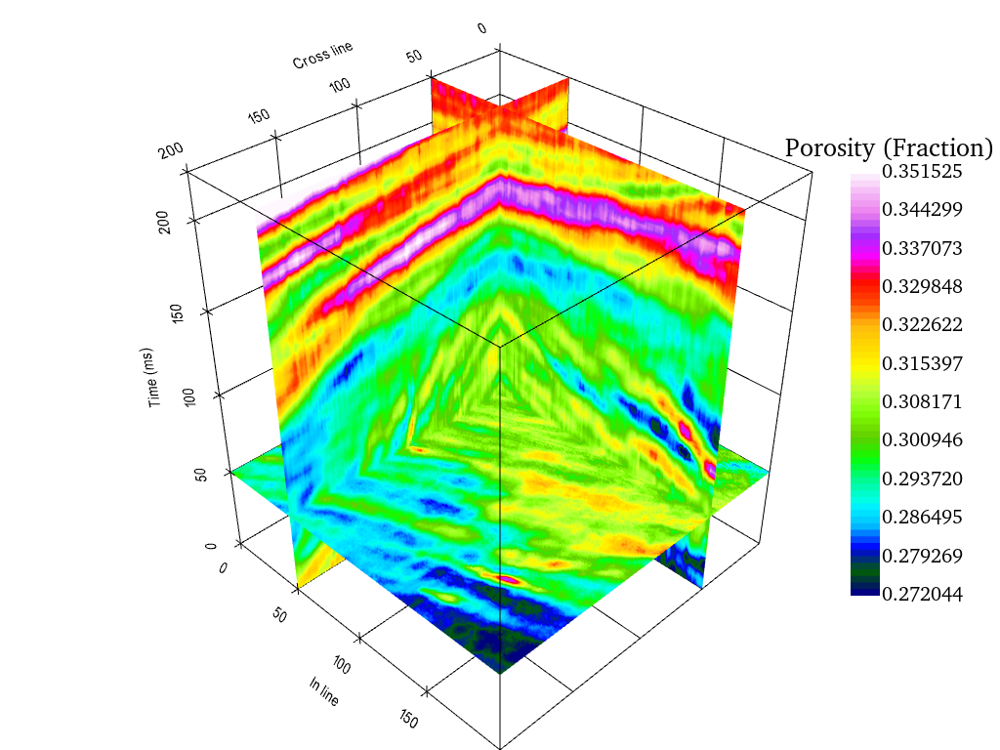

In [204]:
(78, 40401)


sliceF3Por= pv.Plotter()


sliceF3Por.add_mesh(VolumeF3Por.slice_orthogonal(x=50, y=50 , z=50) ,clim=[0.2720436,0.3515245] ,flip_scalars=False ,cmap='gist_ncar' ,lighting=False ,
               scalar_bar_args=ValuePor1 ,render_points_as_spheres=False ,render_lines_as_tubes=True ,
               use_transparency=False ,smooth_shading=True ,annotations=False ,pbr=True ,roughness=0.5 ,
               edge_color=None ,point_size=50.0 ,line_width=500 ,preference='cells')


sliceF3Por.show_grid(xlabel="Cross line", ylabel="In line", zlabel="Time (ms)",
                location='outer',all_edges=True ,padding=0.0  ,color='k' ,use_2d=40 ,grid='outer')

sliceF3Por.show()

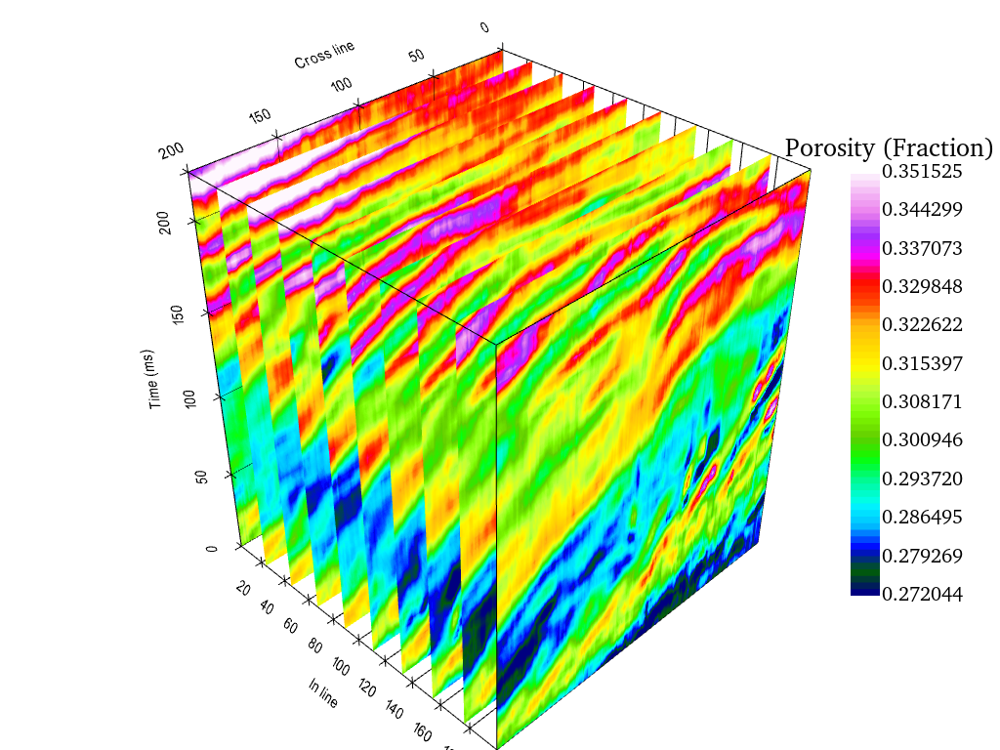

In [209]:
sliceY= pv.Plotter()


sliceY.add_mesh(VolumeF3Por.slice_along_axis(n=10, axis="y") ,clim=[0.2720436,0.3515245] ,flip_scalars=False ,cmap='gist_ncar' ,lighting=False ,
               scalar_bar_args=ValuePor1 ,render_points_as_spheres=False ,render_lines_as_tubes=True ,
               use_transparency=False ,smooth_shading=True ,annotations=False ,pbr=True ,roughness=0.5 ,
               edge_color=None ,point_size=50.0 ,line_width=500 ,preference='cells')


sliceY.show_grid(xlabel="Cross line", ylabel="In line", zlabel="Time (ms)",
                location='outer',all_edges=True ,padding=0.0  ,color='k' ,use_2d=40 ,grid='outer')

sliceY.show()

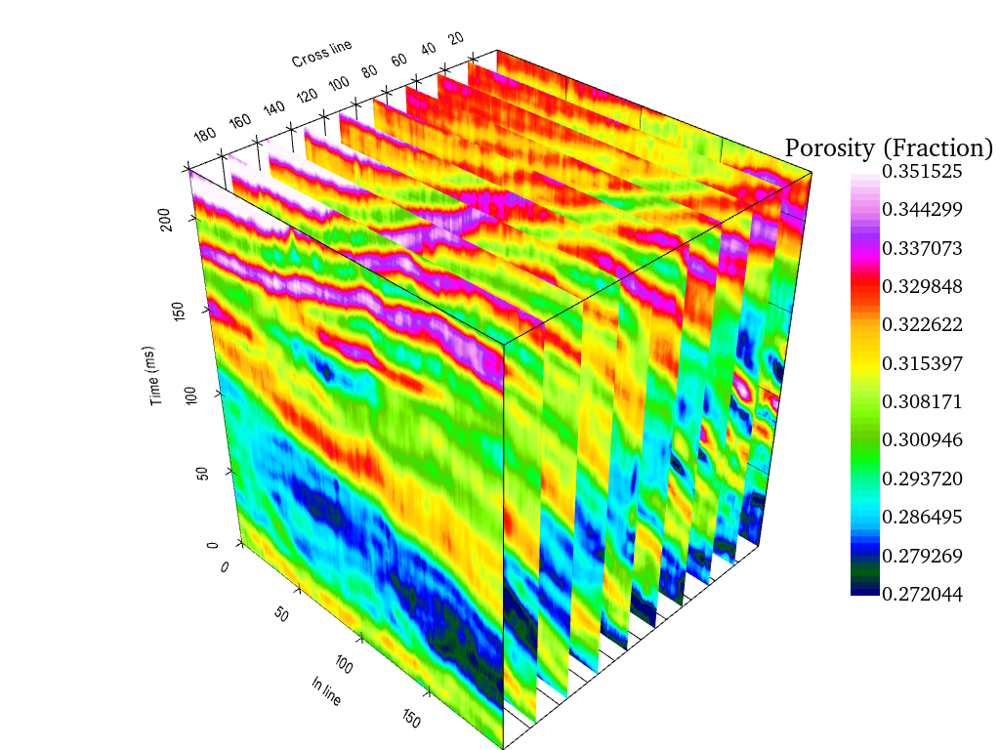

In [212]:
sliceX= pv.Plotter()


sliceX.add_mesh(VolumeF3Por.slice_along_axis(n=10, axis="x") ,clim=[0.2720436,0.3515245] ,flip_scalars=False ,cmap='gist_ncar' ,lighting=False ,
               scalar_bar_args=ValuePor1 ,render_points_as_spheres=False ,render_lines_as_tubes=True ,
               use_transparency=False ,smooth_shading=True ,annotations=False ,pbr=True ,roughness=0.5 ,
               edge_color=None ,point_size=50.0 ,line_width=500 ,preference='cells')


sliceX.show_grid(xlabel="Cross line", ylabel="In line", zlabel="Time (ms)",
                location='outer',all_edges=True ,padding=0.0  ,color='k' ,use_2d=40 ,grid='outer')

sliceX.show()

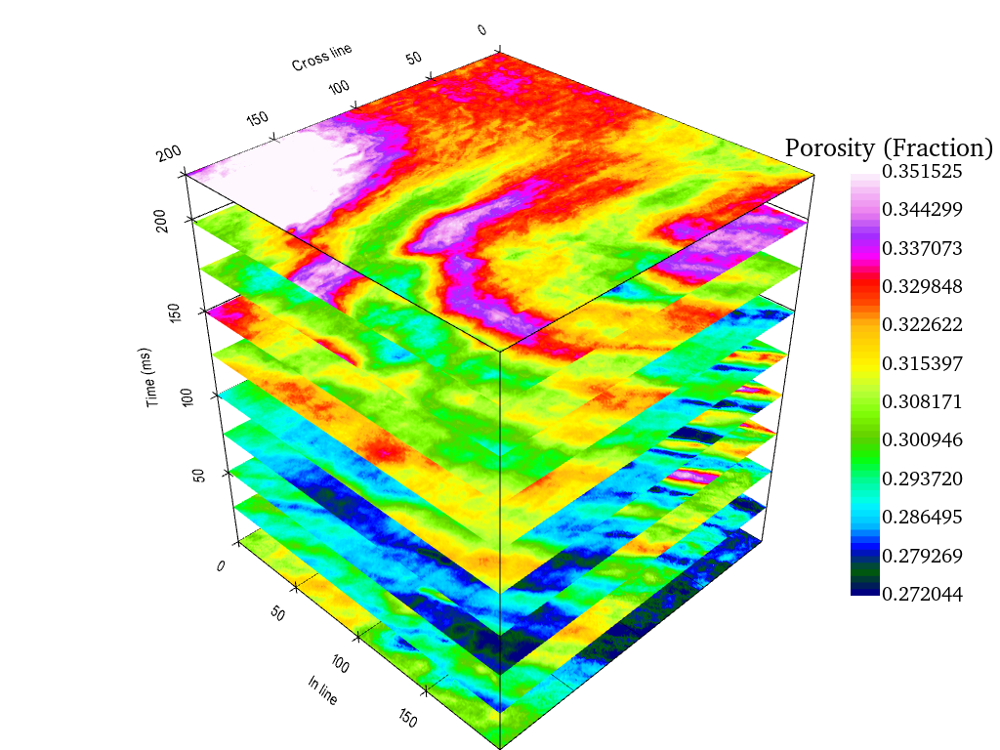

In [211]:
sliceZ= pv.Plotter()


sliceZ.add_mesh(VolumeF3Por.slice_along_axis(n=10, axis="z") ,clim=[0.2720436,0.3515245] ,flip_scalars=False ,cmap='gist_ncar' ,lighting=False ,
               scalar_bar_args=ValuePor1 ,render_points_as_spheres=False ,render_lines_as_tubes=True ,
               use_transparency=False ,smooth_shading=True ,annotations=False ,pbr=True ,roughness=0.5 ,
               edge_color=None ,point_size=50.0 ,line_width=500 ,preference='cells')


sliceZ.show_grid(xlabel="Cross line", ylabel="In line", zlabel="Time (ms)",
                location='outer',all_edges=True ,padding=0.0  ,color='k' ,use_2d=40 ,grid='outer')

sliceZ.show()

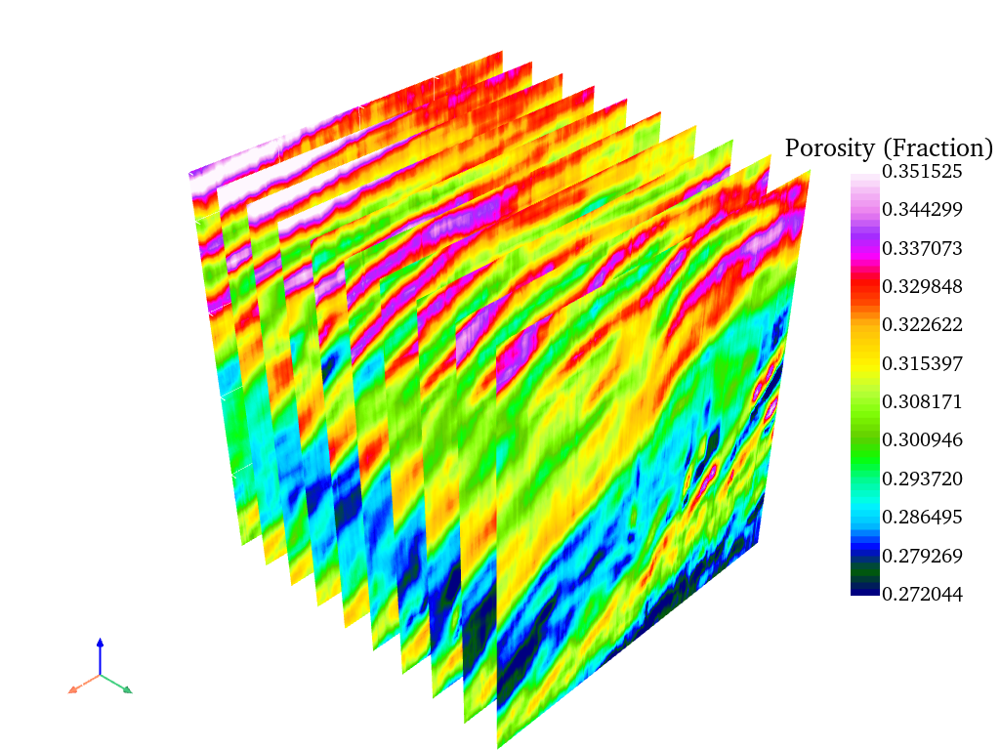

In [208]:
sliceY = VolumeF3Por.slice_along_axis(n=10, axis="y")

sliceY.plot(cmap='gist_ncar',clim=[0.2720436,0.3515245] ,scalar_bar_args=ValuePor1,show_grid=True,lighting=False)

In [179]:
F3Prediction=pd.DataFrame(F3PredPor)
F3Prediction

,0,1,2,3,4,5,6,7,8,9,...,66,67,68,69,70,71,72,73,74,75
0,0.295780,0.310392,0.328316,0.336763,0.339819,0.340938,0.345095,0.338886,0.325675,0.313212,...,0.281193,0.287642,0.294959,0.299330,0.302439,0.310686,0.314672,0.311444,0.303467,0.298300
1,0.294122,0.311970,0.329444,0.337217,0.337472,0.337503,0.341931,0.336822,0.324475,0.311864,...,0.282270,0.288927,0.296539,0.300288,0.303518,0.312648,0.316387,0.311736,0.302832,0.298416
2,0.291923,0.312686,0.329605,0.336404,0.336253,0.337434,0.342910,0.336463,0.324115,0.311215,...,0.279068,0.286194,0.295575,0.300881,0.304642,0.313344,0.316368,0.311698,0.303101,0.298450
3,0.291745,0.311936,0.331050,0.338011,0.338319,0.339704,0.343529,0.336386,0.322923,0.309721,...,0.279597,0.286807,0.295019,0.300040,0.304942,0.312889,0.313142,0.307825,0.301023,0.298343
4,0.292297,0.316336,0.333522,0.339564,0.339005,0.340655,0.342405,0.334556,0.320347,0.307898,...,0.281080,0.288604,0.296792,0.301811,0.306533,0.311734,0.311595,0.307165,0.300361,0.297176
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40396,0.327083,0.330484,0.328809,0.322426,0.317130,0.314570,0.320472,0.326078,0.325503,0.324543,...,0.280469,0.278113,0.276114,0.275397,0.274847,0.279015,0.284355,0.290927,0.291472,0.286850
40397,0.326441,0.330287,0.329227,0.324038,0.318263,0.314855,0.319562,0.325344,0.325288,0.324056,...,0.281026,0.278551,0.277615,0.277335,0.277009,0.279693,0.283875,0.289743,0.289348,0.284502
40398,0.327162,0.330668,0.329241,0.323800,0.318668,0.315065,0.320596,0.325961,0.325390,0.323223,...,0.282186,0.279144,0.277500,0.278223,0.277893,0.279907,0.283395,0.288935,0.288514,0.284535
40399,0.327778,0.330891,0.329649,0.322888,0.317098,0.314139,0.320654,0.325195,0.324480,0.322989,...,0.281389,0.279040,0.277848,0.278231,0.277395,0.279968,0.283484,0.288581,0.288240,0.284331


In [ ]:
model4

### fig2, ax2 = plt.subplots(figsize=(1, 8))
fig2.subplots_adjust(bottom=0.3)

cmap2 = mpl.cm.hot_r 
norm2 = mpl.colors.Normalize(vmin=DFC['Mean-SD'].min(), vmax=DFC['Mean-SD'].max())

CBAR2= fig2.colorbar(mpl.cm.ScalarMappable(norm=norm2, cmap=cmap2),cax=ax2, orientation='vertical')
#TICKS=[0.0002,0.0004,0.0006,0.0008,0.0010,0.0012]
#CBAR2.set_ticks(TICKS)
CBAR2.set_ticklabels(DFC['Mean-SD'])
CBAR2.set_label('Uncertainty (SD)',fontsize=24)

plt.show()

#plt.plot(constrained_layout=True ,figsize=(10, 8)),c=Uncertainty ,c=PredPorosityVExp1['SD']
plt.figure( figsize=(14,10))

plt.scatter(yTest,yhatExp1 ,s=70  ,alpha=1 ,edgecolors='k',cmap='hot_r')


#plt.plot([0.24,0.38],[0.24,0.38], linewidth=2 ,color='k')

#cbar = plt.colorbar()
#cbar.set_label('SD',fontsize=24)
#cbar.ax.tick_params(labelsize=20)

#plt.ylim(0.24,0.38)
#plt.xlim(0.24,0.38)

plt.ylabel('Predicted porosity',fontsize=24 )
plt.xlabel('Real porosity',fontsize=24)

plt.tick_params(axis='both', direction='in',labelsize=20 ,width=3 ,length=6 ,labeltop=False ,labelbottom=True ,
                top=True ,right=True)
#plt.grid()
plt.show()

#plt.plot(constrained_layout=True ,figsize=(10, 8)),c=Uncertainty ,c=PredPorosityVExp1['SD']
plt.figure( figsize=(14,10))

plt.scatter(yTest,yhatExp3 ,s=70  ,alpha=1 ,edgecolors='k',cmap='hot_r')


#plt.plot([0.24,0.38],[0.24,0.38], linewidth=2 ,color='k')

#cbar = plt.colorbar()
#cbar.set_label('SD',fontsize=24)
#cbar.ax.tick_params(labelsize=20)

#plt.ylim(0.24,0.38)
#plt.xlim(0.24,0.38)

plt.ylabel('Predicted porosity',fontsize=24 )
plt.xlabel('Real porosity',fontsize=24)

plt.tick_params(axis='both', direction='in',labelsize=20 ,width=3 ,length=6 ,labeltop=False ,labelbottom=True ,
                top=True ,right=True)
#plt.grid()
plt.show()

#plt.plot(constrained_layout=True ,figsize=(10, 8)),c=Uncertainty ,c=PredPorosityVExp1['SD']
plt.figure( figsize=(14,10))

plt.scatter(yTest,yhatExp4 ,s=70  ,alpha=1 ,edgecolors='k',cmap='hot_r')


#plt.plot([0.24,0.38],[0.24,0.38], linewidth=2 ,color='k')

#cbar = plt.colorbar()
#cbar.set_label('SD',fontsize=24)
#cbar.ax.tick_params(labelsize=20)

#plt.ylim(0.24,0.38)
#plt.xlim(0.24,0.38)

plt.ylabel('Predicted porosity',fontsize=24 )
plt.xlabel('Real porosity',fontsize=24)

plt.tick_params(axis='both', direction='in',labelsize=20 ,width=3 ,length=6 ,labeltop=False ,labelbottom=True ,
                top=True ,right=True)
#plt.grid()
plt.show()

In [72]:
yhatExp1.shape

(28301, 76)

In [81]:
GlobalPred=pd.DataFrame()
GlobalPred['Exp1']=yhatExp1.reshape(-1)
GlobalPred['Exp2']=yhatExp3.reshape(-1)
GlobalPred['Exp3']=yhatExp4.reshape(-1)
GlobalPred['Exp4']=yhatExp7.reshape(-1)
GlobalPredF=pd.DataFrame(GlobalPred)
GlobalPredF['Std']=std(GlobalPred, axis=1)
GlobalPredF['Mean']=mean(GlobalPred, axis=1)
GlobalPredF['True']=yTest.to_numpy().reshape(-1)
GlobalPredF

,Exp1,Exp2,Exp3,Exp4,Std,Mean,True
0,0.349285,0.346071,0.347381,0.342964,0.002302,0.346425,0.345155
1,0.363153,0.360654,0.360374,0.357786,0.001900,0.360492,0.359547
2,0.362053,0.362114,0.361791,0.359776,0.000965,0.361433,0.359557
3,0.349484,0.351210,0.351414,0.351533,0.000831,0.350910,0.347653
4,0.334111,0.335648,0.337190,0.336209,0.001115,0.335790,0.333169
...,...,...,...,...,...,...,...
2150871,0.313985,0.312609,0.315742,0.313106,0.001193,0.313861,0.317225
2150872,0.314130,0.314131,0.316221,0.313336,0.001070,0.314455,0.318912
2150873,0.308559,0.309106,0.309993,0.306970,0.001100,0.308657,0.313252
2150874,0.303708,0.303531,0.301938,0.299704,0.001608,0.302220,0.305732


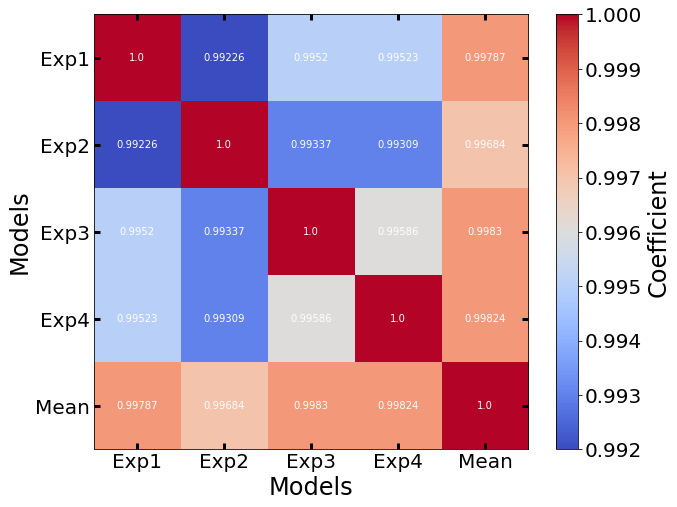

In [301]:
fig = plt.figure(figsize=(10,8), facecolor='white')
ax = fig.add_subplot(111)
Expnames = ['Exp1','Exp2','Exp3','Exp4','Mean']
ExpCorrdata = GlobalPredF[['Exp1','Exp2','Exp3','Exp4','Mean']]
cax = ax.matshow(ExpCorrdata.corr(method = 'pearson').round(3).to_numpy(), vmax=0.992, vmin=1, cmap='coolwarm')

cbar = fig.colorbar(cax)
cbar.set_label('Coefficient',fontsize=24)
cbar.ax.tick_params(labelsize=20)

ticks = np.arange(0,len(Expnames),1)
ax.set_xticks(ticks)
ax.set_yticks(ticks)
ax.set_xticklabels(Expnames)
ax.set_yticklabels(Expnames)

plt.setp(ax.get_xticklabels(), rotation=None)

for i in range(len(Expnames)):
    for j in range(len(Expnames)):
        tex = ax.text(j,i, np.round(ExpCorrdata.corr(method = 'pearson').to_numpy()[i,j], decimals=5), 
                      ha='center', va='center', color='white')

plt.xlabel('Models',fontsize=24)
plt.ylabel('Models',fontsize=24 )
plt.tick_params(axis='both', direction='in',labelsize=20 ,width=3 ,length=6 ,labeltop=False ,labelbottom=True ,
                top=True ,right=True)
plt.show()

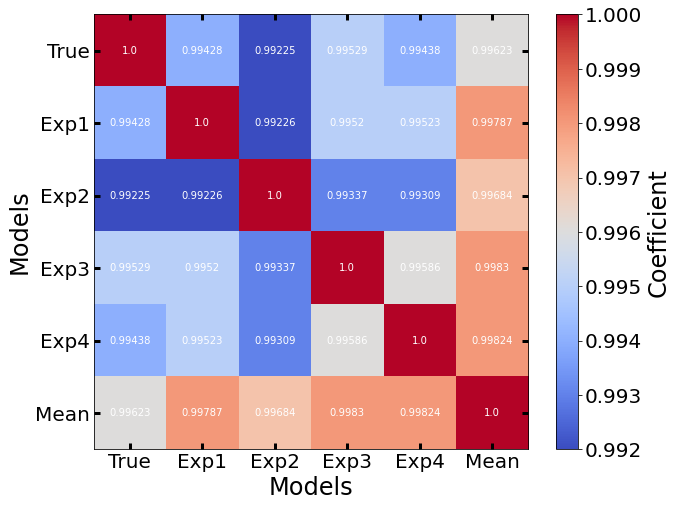

In [300]:
fig = plt.figure(figsize=(10,8), facecolor='white')
ax = fig.add_subplot(111)
Expname2 = ['True','Exp1','Exp2','Exp3','Exp4','Mean']
ExpCorrdata2 = GlobalPredF[['True','Exp1','Exp2','Exp3','Exp4','Mean']]
cax = ax.matshow(ExpCorrdata2.corr(method = 'pearson').round(3).to_numpy(), vmax=0.992, vmin=1, cmap='coolwarm')

cbar = fig.colorbar(cax)
cbar.set_label('Coefficient',fontsize=24)
cbar.ax.tick_params(labelsize=20)

ticks = np.arange(0,len(Expname2),1)
ax.set_xticks(ticks)
ax.set_yticks(ticks)
ax.set_xticklabels(Expname2)
ax.set_yticklabels(Expname2)

plt.setp(ax.get_xticklabels(), rotation=None)

for i in range(len(Expname2)):
    for j in range(len(Expname2)):
        tex = ax.text(j,i, np.round(ExpCorrdata2.corr(method = 'pearson').to_numpy()[i,j], decimals=5), 
                      ha='center', va='center', color='white')

plt.xlabel('Models',fontsize=24)
plt.ylabel('Models',fontsize=24 )
plt.tick_params(axis='both', direction='in',labelsize=20 ,width=3 ,length=6 ,labeltop=False ,labelbottom=True ,
                top=True ,right=True)
plt.show()

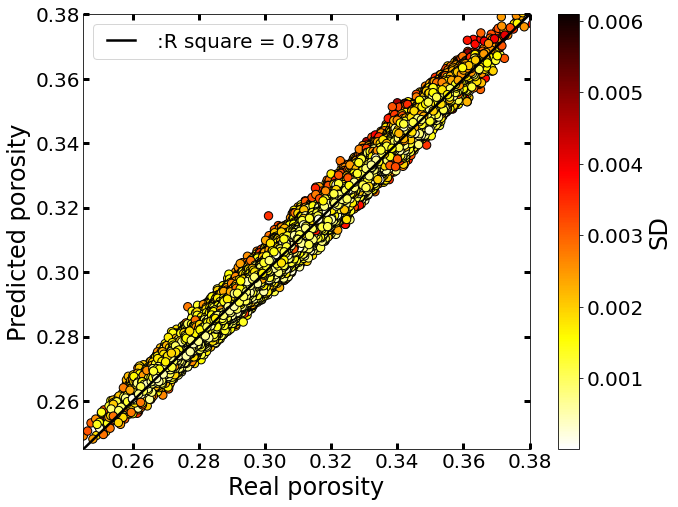

In [96]:
#plt.plot(constrained_layout=True ,figsize=(10, 8)),c=Uncertainty ,c=PredPorosityVExp1['SD']
plt.figure( figsize=(10,8))

plt.scatter(GlobalPredF['True'],GlobalPredF['Exp1'] ,s=70  ,c=GlobalPredF['Std'] ,alpha=1 ,edgecolors='k',cmap='hot_r')


plt.plot([0.24,0.38],[0.24,0.38], linewidth=2.5 ,color='k', label=':R square = 0.978')

cbar = plt.colorbar()
cbar.set_label('SD',fontsize=24)
cbar.ax.tick_params(labelsize=20)

plt.ylim(0.245,0.38)
plt.xlim(0.245,0.38)
plt.xlabel('Real porosity',fontsize=24)
plt.ylabel('Predicted porosity',fontsize=24 )
plt.xlabel('Real porosity',fontsize=24)
plt.legend( loc='best', numpoints=2,fontsize=20)

plt.tick_params(axis='both', direction='in',labelsize=20 ,width=3 ,length=6 ,labeltop=False ,labelbottom=True ,
                top=True ,right=True)
#plt.grid()
plt.show()

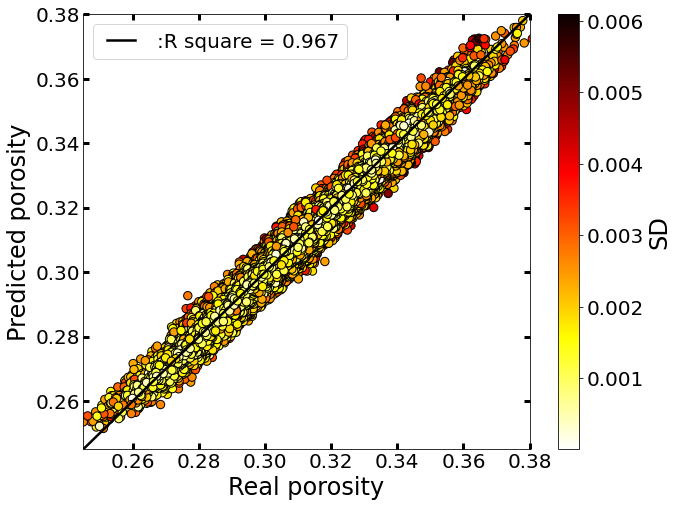

In [95]:
#plt.plot(constrained_layout=True ,figsize=(10, 8)),c=Uncertainty ,c=PredPorosityVExp1['SD']
plt.figure( figsize=(10,8))

plt.scatter(GlobalPredF['True'],GlobalPredF['Exp2'] ,s=70  ,c=GlobalPredF['Std'] ,alpha=1 ,edgecolors='k',cmap='hot_r')


plt.plot([0.24,0.38],[0.24,0.38], linewidth=2.5 ,color='k', label=':R square = 0.967')

cbar = plt.colorbar()
cbar.set_label('SD',fontsize=24)
cbar.ax.tick_params(labelsize=20)

plt.ylim(0.245,0.38)
plt.xlim(0.245,0.38)

plt.ylabel('Predicted porosity',fontsize=24 )
plt.xlabel('Real porosity',fontsize=24)
plt.legend( loc='best', numpoints=2,fontsize=20)
plt.tick_params(axis='both', direction='in',labelsize=20 ,width=3 ,length=6 ,labeltop=False ,labelbottom=True ,
                top=True ,right=True)
#plt.grid()
plt.show()

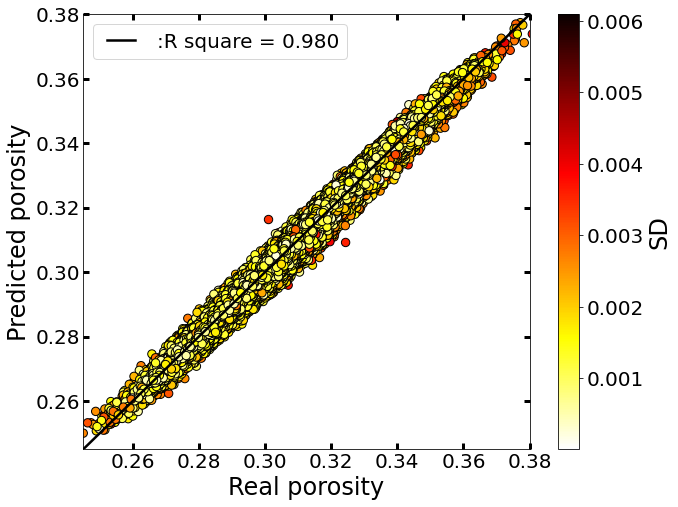

In [94]:
#plt.plot(constrained_layout=True ,figsize=(10, 8)),c=Uncertainty ,c=PredPorosityVExp1['SD']
plt.figure( figsize=(10,8))

plt.scatter(GlobalPredF['True'],GlobalPredF['Exp3'] ,s=70  ,c=GlobalPredF['Std'] ,alpha=1 ,edgecolors='k',cmap='hot_r')


plt.plot([0.24,0.38],[0.24,0.38], linewidth=2.5 ,color='k', label=':R square = 0.980')

cbar = plt.colorbar()
cbar.set_label('SD',fontsize=24)
cbar.ax.tick_params(labelsize=20)

plt.ylim(0.245,0.38)
plt.xlim(0.245,0.38)

plt.ylabel('Predicted porosity',fontsize=24 )
plt.xlabel('Real porosity',fontsize=24)
plt.legend( loc='best', numpoints=2,fontsize=20)

plt.tick_params(axis='both', direction='in',labelsize=20 ,width=3 ,length=6 ,labeltop=False ,labelbottom=True ,
                top=True ,right=True)
#plt.grid()
plt.show()

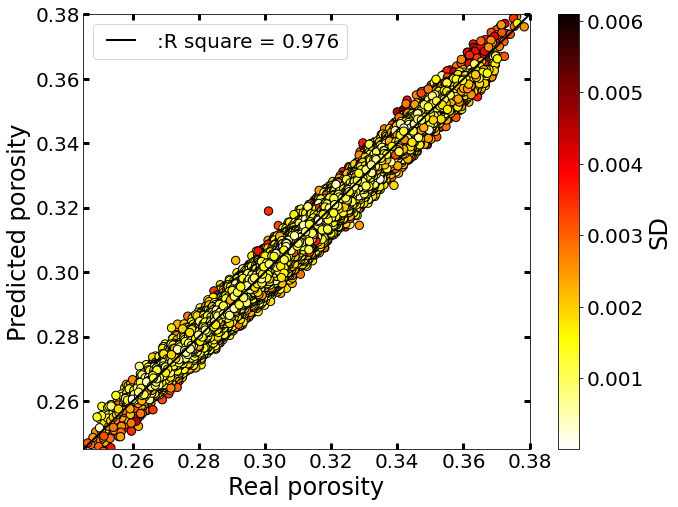

In [97]:
#plt.plot(constrained_layout=True ,figsize=(10, 8)),c=Uncertainty ,c=PredPorosityVExp1['SD']
plt.figure( figsize=(10,8))

plt.scatter(GlobalPredF['True'],GlobalPredF['Exp4'] ,s=70  ,c=GlobalPredF['Std'] ,alpha=1 ,edgecolors='k',cmap='hot_r')


plt.plot([0.24,0.38],[0.24,0.38], linewidth=2 ,color='k', label=':R square = 0.976')

cbar = plt.colorbar()
cbar.set_label('SD',fontsize=24)
cbar.ax.tick_params(labelsize=20)

plt.ylim(0.245,0.38)
plt.xlim(0.245,0.38)

plt.ylabel('Predicted porosity',fontsize=24 )
plt.xlabel('Real porosity',fontsize=24)
plt.legend( loc='best', numpoints=2,fontsize=20)
plt.tick_params(axis='both', direction='in',labelsize=20 ,width=3 ,length=6 ,labeltop=False ,labelbottom=True ,
                top=True ,right=True)
#plt.grid()
plt.show()

In [ ]:
X_train.shape, Xtrain.shape, yval.shape

In [ ]:
Exp01 = model.fit(Xtrain ,ytrain ,batch_size=32 ,verbose=1 ,epochs =30 ,validation_data=(Xval,yval))

In [ ]:
plt.figure( figsize=(10,6))

plt.plot(Exp01.history['r_square'],'-o',markeredgecolor='g' ,color='g',markersize=7.5,markerfacecolor='w' ,
         label='Experiment-1_Train :'+str(str(format(Exp01.history['r_square'][-1],'.3f'))))
plt.plot(Exp01.history['val_r_square'],'-o',markeredgecolor='b' ,color='b',markersize=7.5,markerfacecolor='w' ,
         label='Experiment-1_Test  :'+str(str(format(Exp01.history['val_r_square'][-1],'.3f'))))

plt.tick_params(axis='y', direction='in',labelsize=20 ,width=3 ,length=6 ,labeltop=False ,labelbottom=True ,
                top=False ,right=False)

plt.tick_params(axis='x', direction='in',labelsize=20 ,width=3 ,length=6 ,labeltop=False ,labelbottom=True ,
                top=False ,right=False)

plt.ylabel('Accuracy',fontsize=24)
plt.xlabel('Epochs',fontsize=24)

plt.xlim(0.95,30)
plt.ylim(0.8,0.98)

plt.legend( loc='best', numpoints=2,fontsize=18, ncol=1)
plt.show()

In [ ]:
plt.figure( figsize=(10,6))

plt.plot(Exp01.history['loss'],'-o',markeredgecolor='g' ,color='g',markersize=7.5,markerfacecolor='w' ,
         label='Experiment-1_Train :'+str(str(format(Exp01.history['loss'][-1],'.7f'))))
plt.plot(Exp01.history['val_loss'],'-o',markeredgecolor='b' ,color='b',markersize=7.5,markerfacecolor='w' ,
         label='Experiment-1_Test  :'+str(str(format(Exp01.history['val_loss'][-1],'.7f'))))

plt.tick_params(axis='y', direction='in',labelsize=20 ,width=3 ,length=6 ,labeltop=False ,labelbottom=True ,
                top=False ,right=False)

plt.tick_params(axis='x', direction='in',labelsize=20 ,width=3 ,length=6 ,labeltop=False ,labelbottom=True ,
                top=False ,right=False)

plt.ylabel('Loss',fontsize=24)
plt.xlabel('Epochs',fontsize=24)

plt.xlim(0.95,30)
plt.ylim(0.000003,0.00003)

plt.legend( loc='best', numpoints=2,fontsize=18, ncol=1)
plt.show()

In [ ]:
plt.figure( figsize=(10,6))

plt.plot(Exp01.history['root_mean_squared_error'],'-o',markeredgecolor='g' ,color='g',markersize=7.5,markerfacecolor='w' ,
         label='Experiment-1_Train :'+str(str(format(Exp01.history['root_mean_squared_error'][-1],'.7f'))))
plt.plot(Exp01.history['val_root_mean_squared_error'],'-o',markeredgecolor='b' ,color='b',markersize=7.5,markerfacecolor='w' ,
         label='Experiment-1_Test  :'+str(str(format(Exp01.history['val_root_mean_squared_error'][-1],'.7f'))))

plt.tick_params(axis='y', direction='in',labelsize=20 ,width=3 ,length=6 ,labeltop=False ,labelbottom=True ,
                top=False ,right=False)

plt.tick_params(axis='x', direction='in',labelsize=20 ,width=3 ,length=6 ,labeltop=False ,labelbottom=True ,
                top=False ,right=False)

plt.ylabel('RMSE',fontsize=24)
plt.xlabel('Epochs',fontsize=24)

plt.xlim(0.95,30)
plt.ylim(0.0018,0.0054)

plt.legend( loc='best', numpoints=2,fontsize=18, ncol=1)
plt.show()

In [ ]:
plt.figure( figsize=(10,6))

plt.plot(Exp01.history['mae'],'-o',markeredgecolor='g' ,color='g',markersize=7.5,markerfacecolor='w' ,
         label='Experiment-1_Train :'+str(str(format(Exp01.history['mae'][-1],'.7f'))))
plt.plot(Exp01.history['val_mae'],'-o',markeredgecolor='b' ,color='b',markersize=7.5,markerfacecolor='w' ,
         label='Experiment-1_Test  :'+str(str(format(Exp01.history['val_mae'][-1],'.7f'))))

plt.tick_params(axis='y', direction='in',labelsize=20 ,width=3 ,length=6 ,labeltop=False ,labelbottom=True ,
                top=False ,right=False)

plt.tick_params(axis='x', direction='in',labelsize=20 ,width=3 ,length=6 ,labeltop=False ,labelbottom=True ,
                top=False ,right=False)

plt.ylabel('MAE',fontsize=24)
plt.xlabel('Epochs',fontsize=24)

plt.xlim(0.95,30)
plt.ylim(0.00145,0.0043)

plt.legend( loc='best', numpoints=2,fontsize=18, ncol=1)
plt.show()

In [ ]:

XTest=SeiSamples.drop([0, 1], axis=1)
XTestV = normalize(XTest, axis=1)
print(XTestV.shape)

yTest=SPorSamples.drop([0, 1], axis=1)
print(yTest.shape)


In [ ]:
yhatExp1 = model.predict(XTestV)
print('Predicted: %s' % yhatExp1)

In [ ]:
ZDepth = np.arange(624, 924, 3.99)
ZDepth.shape

In [ ]:
TruePorosity=pd.DataFrame(yTest).T
#TruePorosity['SD']=std(DFCV, axis=1)
TruePorosity['MeanReal']=mean(TruePorosity, axis=1)
TruePorosity['DEPTH']=ZDepth
TruePorosity

In [ ]:
PredPorosity=pd.DataFrame(yhatExp1).T
PredPorosityV=PredPorosity
PredPorosity['SD']=std(PredPorosity, axis=1)
PredPorosity['MeanPred']=mean(PredPorosity, axis=1)
PredPorosityV

In [ ]:
f, ax = plt.subplots(nrows=1, ncols=4, figsize=(10, 13))

# PLOT #0
ax[0].set_ylim(TruePorosity['DEPTH'].min(),TruePorosity['DEPTH'].max())
ax[0].invert_yaxis()
ax[0].set_ylabel("Time (ms)",fontsize=24)

ax[0].plot(TruePorosity['MeanReal'], TruePorosity['DEPTH'], '-', color='k' ,linewidth=2 ,label='True-Porosity')
ax[0].plot(PredPorosity['MeanPred'], TruePorosity['DEPTH'], '-o', color='b',linewidth=2 ,label='Pred-Porosity',
           alpha=1,markersize=7.5,markerfacecolor='w')

ax[0].tick_params(axis='y' ,width=3 ,labelsize=20 ,right=True)
ax[0].tick_params(axis='x', direction='in',labelsize=14 ,width=3 ,labeltop=False ,labelbottom=True ,top=True )
ax[0].legend( loc='best', numpoints = 2 )

cluster1=np.repeat(np.expand_dims(PredPorosity['SD'].values,1), 10, 1)
im=ax[1].imshow(cluster1, interpolation='none', aspect='auto',cmap='hot_r',vmin=PredPorosity['SD'].min(),
                vmax=PredPorosity['SD'].max())  
ax[1].tick_params(axis='both' ,width=3 ,labelsize=12 ,right=False, top=False,bottom=False, left=False,labelbottom=False,
                 labelleft=False)

# PLOT #1
ax[2].set_ylim(TruePorosity['DEPTH'].min(),TruePorosity['DEPTH'].max())
ax[2].invert_yaxis()

ax[2].plot(TruePorosity['MeanReal'], TruePorosity['DEPTH'], '-', color='k' ,linewidth=2 ,label='True-Porosity')
ax[2].plot(PredPorosity['MeanPred'], TruePorosity['DEPTH'], '-o', color='b',linewidth=2 ,label='Pred-Porosity',
           alpha=1,markersize=7.5,markerfacecolor='w')

ax[2].tick_params(axis='y' ,width=3 ,labelsize=20 ,right=True, labelrotation=90)
ax[2].tick_params(axis='x', direction='in',labelsize=15 ,width=3 ,labeltop=False ,labelbottom=True ,top=True )
ax[2].legend( loc='best', numpoints = 2)
ax[2].set_yticklabels([])

cluster2=np.repeat(np.expand_dims(PredPorosity['SD'].values,1), 10, 1)
im=ax[3].imshow(cluster2, interpolation='none', aspect='auto',cmap='hot_r',vmin=PredPorosity['SD'].min(),
                vmax=PredPorosity['SD'].max())  
ax[3].tick_params(axis='both' ,width=3 ,labelsize=12 ,right=False, top=False,bottom=False, left=False,labelbottom=False,
                 labelleft=False)

In [ ]:
f, ax = plt.subplots(nrows=1, ncols=2, figsize=(15, 13))
# PLOT #0
ax[0].set_ylim(DFC['DEPTH'].min(),DFC['DEPTH'].max())
ax[0].invert_yaxis()
ax[0].set_ylabel("Time (ms)",fontsize=24)
#ax.set_title('Trace-0',fontsize=20)
ax[0].plot(round(DFC['Mean-True']*100,1), DFC['DEPTH'], '-', color='k' ,linewidth=2 ,label='True-Porosity')
ax[0].plot(round(DFC['Mean-Pred']*100,1), DFC['DEPTH'], '-o', color='b',linewidth=2 ,label='Pred-Porosity' ,alpha=1
       ,markersize=7.5,markerfacecolor='w')
#ax[0].plot(round(CompResult['Mean-True']*100,1), CompResult['DEPTH'], '-o', color='b',linewidth=2 ,label='Pred' ,alpha=0.6)
ax[0].tick_params(axis='y' ,width=3 ,labelsize=20 ,right=True)
ax[0].tick_params(axis='x', direction='in',labelsize=14 ,width=3 ,labeltop=False ,labelbottom=True ,top=True )
ax[0].legend( loc='best', numpoints = 2 );

In [ ]:
#plt.plot(constrained_layout=True ,figsize=(10, 8)),c=Uncertainty
plt.figure( figsize=(14,10))

plt.scatter(TruePorosity['MeanReal'] ,PredPorosity['MeanPred'] ,s=70  ,alpha=1 ,c=PredPorosity['SD'],
            edgecolors='k',cmap='hot_r')


#plt.plot([0.24,0.38],[0.24,0.38], linewidth=2 ,color='k')

cbar = plt.colorbar()
cbar.set_label('SD',fontsize=24)
cbar.ax.tick_params(labelsize=20)

#plt.ylim(0.24,0.38)
#plt.xlim(0.24,0.38)

plt.ylabel('Predicted porosity',fontsize=24 )
plt.xlabel('Real porosity',fontsize=24)

plt.tick_params(axis='both', direction='in',labelsize=20 ,width=3 ,length=6 ,labeltop=False ,labelbottom=True ,
                top=True ,right=True)
#plt.grid()
plt.show()

In [ ]:
Real=mean(yTest, axis=1)
Real
yTest['RealPor']=Real
yTest

In [ ]:
ResultExp1=pd.DataFrame(yhatExp1)
EvalExp1=ResultExp1
ResultExp1['Std']=std(EvalExp1, axis=1)
ResultExp1['Mean']=mean(EvalExp1, axis=1)
ResultExp1['RealPor']=yTest['RealPor']
#ResultExp1['AE']=np.absolute(Real-ResultExp1['Mean'])#.to_numpy())
ResultExp1

In [ ]:
PredPorosity=pd.DataFrame(yhatExp1).T
PredPorosityV=PredPorosity
PredPorosity['SD']=std(PredPorosity, axis=1)
PredPorosity['Mean']=mean(PredPorosity, axis=1)
PredPorosityV

In [ ]:
TruePorosity=pd.DataFrame(yTest).T
#TruePorosity['SD']=std(DFCV, axis=1)
TruePorosity['Mean']=mean(TruePorosity, axis=1)
TruePorosity

Uncertainty= std(yhatExp1, axis=1) #yhatExp1.shape
Uncertainty.shape

In [ ]:
28301,2150876

In [ ]:
yTest.shape

In [ ]:
#plt.plot(constrained_layout=True ,figsize=(10, 8)),c=Uncertainty
plt.figure( figsize=(14,10))

plt.scatter(yTest['RealPor'] ,ResultExp1['Mean'] ,s=70  ,alpha=1 ,c=ResultExp1['Std'],
            edgecolors='k',cmap='hot_r')


#plt.plot([0.24,0.38],[0.24,0.38], linewidth=2 ,color='k')

cbar = plt.colorbar()
cbar.set_label('SD',fontsize=24)
cbar.ax.tick_params(labelsize=20)

#plt.ylim(0.24,0.38)
#plt.xlim(0.24,0.38)

plt.ylabel('Predicted porosity',fontsize=24 )
plt.xlabel('Real porosity',fontsize=24)

plt.tick_params(axis='both', direction='in',labelsize=20 ,width=3 ,length=6 ,labeltop=False ,labelbottom=True ,
                top=True ,right=True)
#plt.grid()
plt.show()

def get_model(n_inputs, n_outputs):
    model = Sequential()
    model.add(Dense(20, input_dim=n_inputs, kernel_initializer='he_uniform', activation='relu'))
    model.add(Dense(n_outputs, activation='sigmoid'))
    model.compile(loss='binary_crossentropy', optimizer='adam')
    return model

X_trainNorm = normalize(X_train, axis=1)
print(X_trainNorm.shape)

In [ ]:
# get a list of models to evaluate
lst2=list(range(20,95,5))
print(lst2)
def Get_Experiments():
    models = dict()
    # define number of trees to consider
    n_trees = lst2
    for n in n_trees:
        models[str(n)] = RandomForestRegressor(n_estimators=n)
    return models

In [ ]:
Xv=X_train[[2,4,6,8,10,12,14,16,18,20,22,24,26,28,30,32,34,36,38,40,42,44,46,48,50,52,54,56,58,60,62,64,66,68,70,72,
                74,76]]
yv=y_train[[2,4,6,8,10,12,14,16,18,20,22,24,26,28,30,32,34,36,38,40,42,44,46,48,50,52,54,56,58,60,62,64,66,68,70,72,
                74,76]]

In [ ]:
# evaluate a given model using cross-validation
def Evaluate_r2(model, X, y):
    cv = KFold(n_splits=3, random_state=None)
    r2scores = cross_val_score(model, X, y, scoring='r2', cv=cv, n_jobs=-1, error_score='raise')
    return r2scores

# get the models to evaluate
models = Get_Experiments()
# evaluate the models and store results
r2results, names = list(), list()
for name, model in models.items():
    r2scores = Evaluate_r2(model, X_train, y_train)
    r2scores= absolute(r2scores)
    r2results.append(r2scores)
    names.append(name)
    print('Experiment_%s: %.16f SD[%.16f]' % (name, mean(r2scores), std(r2scores)))

In [ ]:
names

In [ ]:
plt.figure( figsize=(10,10))
plt.style.use('default')
plt.boxplot(r2results, patch_artist=False, labels=names,showmeans=False ,notch=False)
plt.tick_params(axis='both', direction='out',labelsize=16 ,width=3 ,length=6 ,labeltop=False ,labelbottom=True ,
                top=False ,right=False)

plt.ylabel('Accuracy',fontsize=24 )
plt.xlabel('Trained models',fontsize=24)

#plt.ylim(0.913,0.9373)
#plt.xlim(0.5,25.5)

plt.show()

In [ ]:
MetricR2 = np.asarray(r2results)
MetricR2[0].shape
MetrixR2=pd.DataFrame(MetricR2)
MeanMR2=mean(MetrixR2, axis=1)
MetrixR2['Mean']=MeanMR2
MetrixR2['Models']=names
MetrixR2

In [ ]:
plt.figure( figsize=(10,6))

plt.plot(MetrixR2[0],'-o',markeredgecolor='g' ,color='g',markersize=7.5,
         markerfacecolor='w' ,label='CV1 R-square  :'+str(str(format(MetrixR2[0][14],'.3f'))))
plt.plot(MetrixR2[1],'-o',markeredgecolor='r' ,color='r',markersize=7.5,
         markerfacecolor='w' ,label='CV2 R-square  :'+str(str(format(MetrixR2[1][14],'.3f'))))
plt.plot(MetrixR2[2],'-o',markeredgecolor='goldenrod' ,color='goldenrod',markersize=7.5,
         markerfacecolor='w' ,label='CV3 R-square  :'+str(str(format(MetrixR2[2][14],'.3f'))))
plt.plot(MetrixR2['Mean'],'-o',markeredgecolor='b' ,color='b', markerfacecolor='w',markersize=7.5,
         label='Mean R-Square :'+str(str(format(MetrixR2['Mean'][14],'.3f'))))



plt.tick_params(axis='y', direction='in',labelsize=20 ,width=3 ,length=6 ,labeltop=False ,labelbottom=True ,
                top=False ,right=False)

plt.tick_params(axis='x', direction='in',labelsize=20 ,width=3 ,length=6 ,labeltop=False ,labelbottom=True ,
                top=False ,right=False)

plt.ylabel('Accuracy-Metric',fontsize=24)
plt.xlabel('Models',fontsize=24)

plt.legend( loc='best', numpoints=2,fontsize=11, ncol=1)
plt.show()

In [ ]:
# evaluate a given model using cross-validation
def Evaluate_RMSE(model, X, y):
    cv = KFold(n_splits=3, random_state=None)
    RMSEscores = cross_val_score(model, X, y, scoring='neg_root_mean_squared_error', cv=cv, n_jobs=-1, error_score='raise')
    return RMSEscores

# get the models to evaluate
models = Get_Experiments()
# evaluate the models and store results
RMSEresults, names = list(), list()
for name, model in models.items():
    RMSEscores = Evaluate_RMSE(model, X_train, y_train)
    RMSEscores= absolute(RMSEscores)
    RMSEresults.append(RMSEscores)
    names.append(name)
    print('Experiment_%s: %.5f & SD:%.6f' % (name, mean(RMSEscores), std(RMSEscores)))

In [ ]:
MetricRMSE = np.asarray(RMSEresults)
MetricRMSE[0].shape
MetrixRMSE=pd.DataFrame(MetricRMSE)
MeanRMSE=mean(MetrixRMSE, axis=1)
MetrixRMSE['Mean']=MeanRMSE
MetrixRMSE['Models']=names
MetrixRMSE

In [ ]:
plt.figure( figsize=(10,6))

plt.plot(MetrixRMSE[0],'-o',markeredgecolor='g' ,color='g',markersize=7.5,
         markerfacecolor='w' ,label='CV1-RMSE  :'+str(str(format(MetrixRMSE[0][14],'.6f'))))
plt.plot(MetrixRMSE[1],'-o',markeredgecolor='r' ,color='r',markersize=7.5,
         markerfacecolor='w' ,label='CV2-RMSE  :'+str(str(format(MetrixRMSE[1][14],'.6f'))))
plt.plot(MetrixRMSE[2],'-o',markeredgecolor='goldenrod' ,color='goldenrod',markersize=7.5,
         markerfacecolor='w' ,label='CV3-RMSE  :'+str(str(format(MetrixRMSE[2][14],'.6f'))))
plt.plot(MetrixRMSE['Mean'],'-o',markeredgecolor='b' ,color='b', markerfacecolor='w',markersize=7.5,
         label=' Mean-RMSE :'+str(str(format(MetrixRMSE['Mean'][14],'.6f'))))

plt.tick_params(axis='y', direction='in',labelsize=20 ,width=3 ,length=6 ,labeltop=False ,labelbottom=True ,
                top=False ,right=False)

plt.tick_params(axis='x', direction='in',labelsize=20 ,width=3 ,length=6 ,labeltop=False ,labelbottom=True ,
                top=False ,right=False)

plt.ylabel('Loss-Metric',fontsize=24)
plt.xlabel('Models',fontsize=24)

plt.legend( loc='best', numpoints=2,fontsize=11, ncol=1)
plt.show()

In [ ]:
X_TEST=Seisdf.drop([0, 1], axis=1)
y_TEST=Pordf.drop([0, 1], axis=1)
print(X_TEST.shape) ,print(y_TEST.shape)

In [ ]:
# evaluate a given model using cross-validation
def Predict(model, X,y):
    cv = KFold(n_splits=3, random_state=None)
    y_predTest = cross_val_predict(model, X, y, cv=cv )
    return y_predTest

# get the models to evaluate
models = Get_Experiments()
# evaluate the models and store results
PredictionTest, names = list(), list()
for name, model in models.items():
    y_predTest = Predict(model, X_TEST,y_TEST)
    y_predTest= absolute(y_predTest)
    PredictionTest.append(y_predTest)
    names.append(name)
    print('MeanPredPorosity_%s: %.5f & SD:%.6f' % (name, mean(y_predTest), std(y_predTest)))

In [ ]:
y_predTest[9].shape

In [ ]:
Result0=PredictionTest[0].reshape(-1)
Result1=PredictionTest[1].reshape(-1)
Result2=PredictionTest[2].reshape(-1)
Result3=PredictionTest[3].reshape(-1)
Result4=PredictionTest[4].reshape(-1)
Result5=PredictionTest[5].reshape(-1)
Result6=PredictionTest[6].reshape(-1)
Result7=PredictionTest[7].reshape(-1)
Result8=PredictionTest[8].reshape(-1)
Result9=PredictionTest[9].reshape(-1)
Result10=PredictionTest[10].reshape(-1)
Result11=PredictionTest[11].reshape(-1)
Result12=PredictionTest[12].reshape(-1)
Result13=PredictionTest[13].reshape(-1)
Result14=PredictionTest[14].reshape(-1)
#Result15=PredictionTest[15].reshape(-1)
#Result16=PredictionTest[16].reshape(-1)
#Result17=PredictionTest[17].reshape(-1)
#Result18=PredictionTest[18].reshape(-1)
#Result19=PredictionTest[19].reshape(-1)
#Result20=PredictionTest[20].reshape(-1)
#Result21=PredictionTest[21].reshape(-1)
#Result22=PredictionTest[22].reshape(-1)
#Result23=PredictionTest[23].reshape(-1)
#Result24=PredictionTest[24].reshape(-1)
RealPor=y_TEST.to_numpy().reshape(-1)

In [ ]:
PredictedPorTest=pd.DataFrame()#.T
PredictedPorTest['Exp1']=Result0
PredictedPorTest['Exp2']=Result1
PredictedPorTest['Exp3']=Result2
PredictedPorTest['Exp4']=Result3
PredictedPorTest['Exp5']=Result4
PredictedPorTest['Exp6']=Result5
PredictedPorTest['Exp7']=Result6
PredictedPorTest['Exp8']=Result7
PredictedPorTest['Exp9']=Result8
PredictedPorTest['Exp10']=Result9
PredictedPorTest['Exp11']=Result10
PredictedPorTest['Exp12']=Result11
PredictedPorTest['Exp13']=Result12
PredictedPorTest['Exp14']=Result13
PredictedPorTest['Exp15']=Result14
#PredictedPorTest['Exp16']=Result15
#PredictedPorTest['Exp17']=Result16
#PredictedPorTest['Exp18']=Result17
#PredictedPorTest['Exp19']=Result18
#PredictedPorTest['Exp20']=Result19
#PredictedPorTest['Exp21']=Result20
#PredictedPorTest['Exp22']=Result21
#PredictedPorTest['Exp23']=Result22
#PredictedPorTest['Exp24']=Result23
#PredictedPorTest['Exp25']=Result24
#PredictedPorTest.to_csv('PredictedPorTest.csv')
PredictedPorTest

In [ ]:
import seaborn as sns
pear_corrC=PredictedPorTest.corr(method='pearson')
pear_corrC

In [ ]:
#plt.figure( figsize=(10,6))
corr1 = PredictedPorTest.corr(method='pearson')#.round(3)
plt.figure(figsize=(12,8))
sns.heatmap(corr1, annot=True, cmap="YlGnBu")
plt.show()

In [ ]:
PCoor2=pd.DataFrame(PredictedPorTest)
PCoor2['Mean']=mean(PredictedPorTest, axis=1)
PCoor2['RealPorosity']=RealPor

PCoor2

In [ ]:
#plt.figure( figsize=(10,6))
corr2 = PCoor2.corr(method='pearson')#.round(7)
plt.figure(figsize=(12,8))
sns.heatmap(corr2, annot=True)
plt.show()

In [ ]:
corr2

In [ ]:
PredictedPorDataTest=PCoor2
#PredictedPorTest['Mean']=mean(PredictedPorTest, axis=1)
PredictedPorDataTest['Std']=std(PredictedPorTest, axis=1)
PredictedPorDataTest['AE']=np.absolute(RealPor-mean(PredictedPorTest, axis=1).to_numpy())
#PredictedPorTest['RealPorosity']=RealPor
#PredictedPorTest.to_csv('PredictedPorTest.csv')
PredictedPorDataTest

In [ ]:
#PredictedPorTest.to_csv('Vresults.csv')

In [ ]:
#plt.plot(constrained_layout=True ,figsize=(10, 8))
plt.figure( figsize=(14,10))

plt.scatter(PredictedPorDataTest['RealPorosity'] ,PredictedPorDataTest['Mean'] ,s=70 ,c=PredictedPorDataTest['Std'] ,alpha=1 ,
            edgecolors='k',cmap='hot_r')


#plt.plot([0.24,0.38],[0.24,0.38], linewidth=2 ,color='k')

cbar = plt.colorbar()
cbar.set_label('SD',fontsize=24)
cbar.ax.tick_params(labelsize=20)

#plt.ylim(0.24,0.38)
#plt.xlim(0.24,0.38)

plt.ylabel('Predicted porosity',fontsize=24 )
plt.xlabel('Real porosity',fontsize=24)

plt.tick_params(axis='both', direction='in',labelsize=20 ,width=3 ,length=6 ,labeltop=False ,labelbottom=True ,
                top=True ,right=True)
#plt.grid()
plt.show()

In [ ]:
#plt.plot(constrained_layout=True ,figsize=(10, 8))
plt.figure( figsize=(14,10))

plt.scatter(PredictedPorDataTest['Std'] ,PredictedPorDataTest['AE'] ,s=70 ,c='teal' ,alpha=1 ,edgecolors='k')


#plt.plot([0.000,0.006],[0.00,0.0455], linewidth=2 ,color='k', label=':AE = 0.0455 SD')

#cbar = plt.colorbar()
#cbar.set_label('Absolute error',fontsize=24)
#cbar.ax.tick_params(labelsize=20)

#plt.ylim(0.00,0.055)
#plt.xlim(0.000,0.0055)

plt.ylabel('Absolute error',fontsize=24 )
plt.xlabel('Standard deviation',fontsize=24)

#plt.legend( loc='best', numpoints=2,fontsize=20)
plt.tick_params(axis='both', direction='in',labelsize=20 ,width=3 ,length=6 ,labeltop=False ,labelbottom=True ,
                top=True ,right=True)
#plt.grid()
plt.show()

In [ ]:
PredictedPor=pd.DataFrame(PredictedPorTest)
#PredictedPor
PredictedPor

In [ ]:
TruePor=pd.DataFrame(y_TEST).T
TruePor

In [ ]:
ZDepth = np.arange(624, 924, 3.99)
ZDepth.shape

In [ ]:
RealPor=mean(TruePor, axis=1)
RealPor

In [ ]:
PredictedPorV=mean(PredictedPor, axis=1).to_numpy().reshape(76,40401 )
PredictedPorV

In [ ]:
PredReal=pd.DataFrame(PredictedPorV)
PredReal

In [ ]:
RealPred=mean(PredReal, axis=1)
RealPred

In [ ]:
CompResult=pd.DataFrame()
CompResult['DEPTH']=ZDepth
CompResult['Mean-True']=RealPor
CompResult['Mean-Pred']=RealPred
CompResult['Mean-SD']=mean(Uncertainty, axis=1)
FinalCompRes = CompResult#.drop([0, 1], axis=0)
#FinalCompRes.to_csv('FinalCompRes.csv')
CompResult

In [ ]:
DFCV=CompResult
DFCV['AE']=np.absolute(CompResult['Mean-True']-CompResult['Mean-Pred'].to_numpy())
DFCV['Mean-Predv']=np.absolute(CompResult['Mean-Pred']+CompResult['AE'].to_numpy())
DFCV

In [ ]:
DFC=DFCV[2:]
DFC

In [ ]:
f, ax = plt.subplots( figsize=(3, 14))
# PLOT #0
ax.set_ylim(DFC['DEPTH'].min(),DFC['DEPTH'].max())
ax.invert_yaxis()
ax.set_ylabel("Time (ms)",fontsize=24)
#ax.set_title('Trace-0',fontsize=20)
ax.plot(DFC['Mean-True'], DFC['DEPTH'], '-', color='k' ,linewidth=2 ,label='True-Porosity')
ax.plot(DFC['Mean-Predv'], DFC['DEPTH'], '-o', color='b',linewidth=2 ,label='Pred-Porosity' ,alpha=1
       ,markersize=7.5,markerfacecolor='w')
#ax.plot(round(CompResult['Mean-True']*100,1), CompResult['DEPTH'], '-o', color='b',linewidth=2 ,label='Pred' ,alpha=0.6)
ax.tick_params(axis='y' ,width=3 ,labelsize=20 ,right=True)
ax.tick_params(axis='x', direction='in',labelsize=14 ,width=3 ,labeltop=False ,labelbottom=True ,top=True )
ax.legend( loc='best', numpoints = 2 );

In [ ]:
Uncertainty=pd.DataFrame(PredictedPorDataTest['Std'])

#XYCoordFinalV=XYCoordFinal
#XYCoordFinalV['X']=XYCoord[0]
#XYCoordFinalV['y']=XYCoord[1]
Uncertainty

In [ ]:
PredictFinalUncert=Uncertainty.to_numpy().reshape((40401,76))
PredictFinalUncertT=PredictFinalUncert.T
PredictFinalUncertT.shape

In [ ]:
PredictedVUncertaintyVol=pd.DataFrame(PredictFinalUncertT)#.T
PredictedVUncertaintyVol.shape

In [ ]:
Uncertainty=pd.DataFrame(PredictedPorDataTest['Std']).to_numpy().reshape((40401,76)).T
Uncertainty.shape#

In [ ]:
Uncertainty=pd.DataFrame(PredictedPorDataTest['RealPorosity']).to_numpy().reshape((40401,76)).T
Uncertainty.shape#

In [ ]:
B=y_TEST.T.to_numpy()
B.shape

In [ ]:
import pyvista as pv
pv.set_jupyter_backend('static') 
#pv.set_plot_theme('dark')

ReshapedDataPorUnc = Uncertainty.reshape((76,201,201))
mat_slicePorUnc = ReshapedDataPorUnc#[6:] # Simple indexing
TransposedDataPorUnc=mat_slicePorUnc.T
FlippedDataPorUnc=np.flip(TransposedDataPorUnc)

print ('ReshapedData shape is:', mat_slicePorUnc.shape)
print ('Transposed&FlippedData shape is:', FlippedDataPorUnc.shape)

VolumePorUnc = pv.UniformGrid()
VolumePorUnc.dimensions = FlippedDataPorUnc.shape

VolumePorUnc.origin = (0 , 0 , 0)
VolumePorUnc.spacing = (1, 1, 3)  # These are the cell sizes along each axis
VolumePorUnc.point_data["Porosity (Fraction)"] = FlippedDataPorUnc.flatten(order='F').T #'C', 'F', 'A', or 'K'

In [ ]:
VolumePorUnc

In [ ]:
PlotUncertainty = pv.Plotter()

#,clim=[7.781e-05,5.562e-03] clim=[0.2720436,0.3515245] 2.669e-01,3.587e-01

PlotUncertainty.add_mesh(VolumePorUnc.slice_orthogonal(x=50, y=50 , z=50) ,clim=[0.000070,0.0050] ,flip_scalars=False,
                      cmap='hot_r' ,lighting=False ,scalar_bar_args=ValueSeis1 ,render_points_as_spheres=False,
                      render_lines_as_tubes=True ,use_transparency=False ,smooth_shading=True ,annotations=False,
                      pbr=True ,roughness=0.5 ,edge_color=None ,point_size=50.0 ,line_width=500 ,preference='cells')


PlotUncertainty.show_grid(xlabel="Cross line", ylabel="In line", zlabel="Time (ms)",
                location='outer',all_edges=True ,padding=0.0  ,color='k' ,use_2d=40 ,grid='outer')

PlotUncertainty.show()

In [ ]:
sliceIMG = pv.Plotter()


sliceIMG.add_mesh(VolumePor.slice_orthogonal(x=50, y=50 , z=50) ,clim=[0.2720436,0.3515245] ,flip_scalars=False ,cmap='gist_ncar' ,lighting=False ,
               scalar_bar_args=ValuePor1 ,render_points_as_spheres=False ,render_lines_as_tubes=True ,
               use_transparency=False ,smooth_shading=True ,annotations=False ,pbr=True ,roughness=0.5 ,
               edge_color=None ,point_size=50.0 ,line_width=500 ,preference='cells')


sliceIMG.show_grid(xlabel="Cross line", ylabel="In line", zlabel="Time (ms)",
                location='outer',all_edges=True ,padding=0.0  ,color='k' ,use_2d=40 ,grid='outer')

sliceIMG.show()